## Анализ бизнес-показателей Procrastinate Pro+

Анализ бизнес-показателей Procrastinate Pro+ направлен на поиск причин, по которым затраты на рекламу приложения не окупаются, а также способов, которые позволят устранить эти причины.

Для анализа будут использованы данные о посещениях приложения, а также о покупках пользователей и затратах на их привлечение по дням и каналам. 

План работы:
* изучить исходные данные и проверить их качество;
* составить профили пользователей с датой их привлечения;
* рассчитать LTV, CAC, ROI, а также удержание и конверсию пользователей как для всего проекта, так и с разбивкой по странам, устройствам и каналам привлечения;
* на основе полученых данных выявить возможные проблемы и пути их решения.

### Загрузка и подготовка данных

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
# выгрузка датасетов

try:
    visits = pd.read_csv('visits_info_short.csv')
    orders = pd.read_csv('orders_info_short.csv')
    costs = pd.read_csv('costs_info_short.csv')
    
except:
    visits = pd.read_csv('/datasets/visits_info_short.csv')
    orders = pd.read_csv('/datasets/orders_info_short.csv')
    costs = pd.read_csv('/datasets/costs_info_short.csv')

In [3]:
display(visits.head(5))
display(orders.head(5))
costs.head(5)

,User Id,Region,Device,Channel,Session Start,Session End
0,981449118918,United States,iPhone,organic,2019-05-01 02:36:01,2019-05-01 02:45:01
1,278965908054,United States,iPhone,organic,2019-05-01 04:46:31,2019-05-01 04:47:35
2,590706206550,United States,Mac,organic,2019-05-01 14:09:25,2019-05-01 15:32:08
3,326433527971,United States,Android,TipTop,2019-05-01 00:29:59,2019-05-01 00:54:25
4,349773784594,United States,Mac,organic,2019-05-01 03:33:35,2019-05-01 03:57:40


,User Id,Event Dt,Revenue
0,188246423999,2019-05-01 23:09:52,4.99
1,174361394180,2019-05-01 12:24:04,4.99
2,529610067795,2019-05-01 11:34:04,4.99
3,319939546352,2019-05-01 15:34:40,4.99
4,366000285810,2019-05-01 13:59:51,4.99


,dt,Channel,costs
0,2019-05-01,FaceBoom,113.3
1,2019-05-02,FaceBoom,78.1
2,2019-05-03,FaceBoom,85.8
3,2019-05-04,FaceBoom,136.4
4,2019-05-05,FaceBoom,122.1


#### Обработка датасета visits

In [4]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309901 entries, 0 to 309900
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   User Id        309901 non-null  int64 
 1   Region         309901 non-null  object
 2   Device         309901 non-null  object
 3   Channel        309901 non-null  object
 4   Session Start  309901 non-null  object
 5   Session End    309901 non-null  object
dtypes: int64(1), object(5)
memory usage: 14.2+ MB


In [5]:
# обработка названий столбцов
visits.columns = visits.columns.str.lower().str.strip().str.replace(' ', '_')

# приведение дат к формату datetime
visits['session_start'] = pd.to_datetime(visits['session_start'])
visits['session_end'] = pd.to_datetime(visits['session_end'])

In [6]:
# проверка количества дубликатов.
visits.duplicated().sum()

0

In [7]:
# проверка на неявные дубликаты
display(visits['region'].unique())
display(visits['device'].unique())
visits['channel'].unique()

array(['United States', 'UK', 'France', 'Germany'], dtype=object)

array(['iPhone', 'Mac', 'Android', 'PC'], dtype=object)

array(['organic', 'TipTop', 'RocketSuperAds', 'YRabbit', 'FaceBoom',
       'MediaTornado', 'AdNonSense', 'LeapBob', 'WahooNetBanner',
       'OppleCreativeMedia', 'lambdaMediaAds'], dtype=object)

In [8]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309901 entries, 0 to 309900
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   user_id        309901 non-null  int64         
 1   region         309901 non-null  object        
 2   device         309901 non-null  object        
 3   channel        309901 non-null  object        
 4   session_start  309901 non-null  datetime64[ns]
 5   session_end    309901 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(3)
memory usage: 14.2+ MB


#### Обработка датасета orders

In [9]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40212 entries, 0 to 40211
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   User Id   40212 non-null  int64  
 1   Event Dt  40212 non-null  object 
 2   Revenue   40212 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 942.6+ KB


In [10]:
# обработка названий столбцов
orders.columns = orders.columns.str.lower().str.strip().str.replace(' ', '_')

# приведение дат к формату datetime
orders['event_dt'] = pd.to_datetime(orders['event_dt'])

# проверка количества дубликатов
orders.duplicated().sum()

0

In [11]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40212 entries, 0 to 40211
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   user_id   40212 non-null  int64         
 1   event_dt  40212 non-null  datetime64[ns]
 2   revenue   40212 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 942.6 KB


#### Обработка датасета costs

In [12]:
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1800 entries, 0 to 1799
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   dt       1800 non-null   object 
 1   Channel  1800 non-null   object 
 2   costs    1800 non-null   float64
dtypes: float64(1), object(2)
memory usage: 42.3+ KB


In [13]:
# обработка названий столбцов
costs.columns = costs.columns.str.lower()

# приведение дат к формату datetime
costs['dt'] = pd.to_datetime(costs['dt'])

# проверка количества дубликатов
costs.duplicated().sum()

0

In [14]:
# удаление неявных дубликатов
costs['channel'].unique()

array(['FaceBoom', 'MediaTornado', 'RocketSuperAds', 'TipTop', 'YRabbit',
       'AdNonSense', 'LeapBob', 'OppleCreativeMedia', 'WahooNetBanner',
       'lambdaMediaAds'], dtype=object)

В имеющихся датасетах нет дубликатов или пропусков, однако в датасетах orders и costs данные в стобцах с датами были в неверном формате. Помели их на формат datetime.

### Функции для расчёта и анализа LTV, ROI, удержания и конверсии

In [15]:
# функция создания профилей пользователей
def get_profiles(visits, orders, costs, events, event_names=[]):
    
    # получаем данные о первом визите
    profiles = (visits.sort_values(['user_id', 'session_start'])
                           .groupby('user_id')
                           .agg(
                               {'session_start': 'first',
                                 'channel': 'first',
                                 'device': 'first',
                                 'region': 'first'
                               }
                               )
                           .rename(columns={'session_start': 'first_ts'})
                           .reset_index()
                    )
    
    # добавляем месяц и дату первого визита
    profiles['dt'] = profiles['first_ts'].dt.date
    profiles['month'] = profiles['first_ts'].astype('datetime64[M]')
    
    # добавляем категоризацию по платящим/неплатящим пользователям
    profiles['payer'] = profiles['user_id'].isin(orders['user_id'].unique())
    
    # добавляем флаги событий (при необходимости)
    for event in event_names:
        if event in event['event_names'].unique():
            profiles['user_id'].isin(events.query('event_name == @event')['user_id'].unique())
    
    # добавляем стоимость привлечения пользователя
    new_users = (profiles.groupby(['dt', 'channel'])
                              .agg({'user_id': 'nunique'})
                              .rename(columns={'user_id': 'unique_users'})
                              .reset_index()
                )
    
    costs['dt'] = costs['dt'].dt.date
    costs = costs.merge(new_users, on=['dt', 'channel'], how='left')
    costs['acquisition_cost'] = costs['costs'] / costs['unique_users']
    
    profiles = profiles.merge(costs[['dt', 'channel', 'acquisition_cost']], on=['dt', 'channel'], how='left')
    profiles['acquisition_cost'] = profiles['acquisition_cost'].fillna(0)
    
    return profiles

In [16]:
# функция для расчёта удержания

def get_retention(profiles,
                  visits,
                  observation_date,
                  horizon_days,
                  dimensions=[],
                  ignore_horizon=False,
                 ):

    # добавляем столбец payer
    dimensions = ['payer'] + dimensions

    # учитваем горизонт
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(days=horizon_days - 1)
        
    profiles['dt'] = pd.to_datetime(profiles['dt'])
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')

    # собираем данные
    result_raw = result_raw.merge(visits[['user_id', 'session_start']], 
                                  on='user_id', 
                                  how='left'
                                 )
    result_raw['lifetime'] = (result_raw['session_start'] - result_raw['first_ts']).dt.days

    # функция для группировки таблицы по заданным признакам
    def group_by_dimensions(df, dims, horizon_days):
        
        result = df.pivot_table(index=dims, 
                                columns='lifetime', 
                                values='user_id', 
                                aggfunc='nunique'
                               )
        
        cohort_sizes = (df.groupby(dims)
                        .agg({'user_id': 'nunique'})
                        .rename(columns={'user_id': 'cohort_size'})
                       )
        
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        result = result.div(result['cohort_size'], axis=0)
        result = result[['cohort_size'] + list(range(horizon_days))]
        result['cohort_size'] = cohort_sizes
        return result

    # таблица удержания
    result_grouped = group_by_dimensions(result_raw, dimensions, horizon_days)

    # таблица динамики удержания
    result_in_time = group_by_dimensions(result_raw, dimensions + ['dt'], horizon_days)

    return result_raw, result_grouped, result_in_time 

In [17]:
# функция для конверсии
def get_conversion(
    profiles,
    orders,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # учитываем горизонт
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(days=horizon_days - 1)
    
    profiles['dt'] = pd.to_datetime(profiles['dt'])
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')

    # определяем дату и время первой покупки
    first_purchase = (orders.sort_values(by=['user_id', 'event_dt'])
                            .groupby('user_id')
                            .agg({'event_dt': 'first'})
                            .reset_index()
                     )

    result_raw = result_raw.merge(first_purchase[['user_id', 'event_dt']], on='user_id', how='left')

    # рассчитываем лайфтайм для каждой покупки
    result_raw['lifetime'] = (result_raw['event_dt'] - result_raw['first_ts']).dt.days

    # создаем столбец для группировки по всем пользователям, если других признаков нет
    if len(dimensions) == 0:
        result_raw['cohort'] = 'All users' 
        dimensions = dimensions + ['cohort']

    # функция для группировки таблицы по желаемым признакам
    def group_by_dimensions(df, dims, horizon_days):
        
        result = df.pivot_table(index=dims, 
                                columns='lifetime', 
                                values='user_id', 
                                aggfunc='nunique'
                               )
        
        result = result.fillna(0).cumsum(axis = 1)
        
        cohort_sizes = (df.groupby(dims)
                        .agg({'user_id': 'nunique'})
                        .rename(columns={'user_id': 'cohort_size'})
                       )
        
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        
        # получаем conversion rate
        result = result.div(result['cohort_size'], axis=0)
        result = result[['cohort_size'] + list(range(horizon_days))]
        result['cohort_size'] = cohort_sizes
        return result

    # таблица конверсии
    result_grouped = group_by_dimensions(result_raw, 
                                         dimensions, 
                                         horizon_days
                                        )

    # таблица динамики
    if 'cohort' in dimensions: 
        dimensions = []

    result_in_time = group_by_dimensions(result_raw, 
                                         dimensions + ['dt'], 
                                         horizon_days
                                        )

    return result_raw, result_grouped, result_in_time

In [18]:
# функция для LTV и ROI

def get_ltv(profiles,
            orders,
            observation_date,
            horizon_days,
            dimensions=[],
            ignore_horizon=False
           ):

    # учитываем горизонт
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(days=horizon_days - 1)
        
    profiles['dt'] = pd.to_datetime(profiles['dt'])
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')
    
    # добавляем данные о покупках
    result_raw = result_raw.merge(orders[['user_id', 'event_dt', 'revenue']], on='user_id', how='left')
    
    result_raw['lifetime'] = (result_raw['event_dt'] - result_raw['first_ts']).dt.days
    
    # создаем столбец для группировки по всем пользователям, если других признаков нет
    if len(dimensions) == 0:
        result_raw['cohort'] = 'All users'
        dimensions = dimensions + ['cohort']

    # функция группировки по желаемым признакам
    def group_by_dimensions(df, dims, horizon_days):
        
        result = df.pivot_table(index=dims, 
                                columns='lifetime', 
                                values='revenue', 
                                aggfunc='sum'
                               )
        
        result = result.fillna(0).cumsum(axis=1)
        
        cohort_sizes = (df.groupby(dims)
                        .agg({'user_id': 'nunique'})
                        .rename(columns={'user_id': 'cohort_size'})
                       )
        
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        
        # считаем LTV
        result = result.div(result['cohort_size'], axis=0)
        result = result[['cohort_size'] + list(range(horizon_days))]
        result['cohort_size'] = cohort_sizes

        # считаем средний CAC
        cac = df[['user_id', 'acquisition_cost'] + dims].drop_duplicates()
        cac = (cac.groupby(dims)
               .agg({'acquisition_cost': 'mean'})
               .rename(columns={'acquisition_cost': 'cac'})
              )

        # считаем ROI
        roi = result.div(cac['cac'], axis=0)

        # удаляем строки с органиками и бесплатными каналами привлечения, если такие есть (бесконечный ROI из-за деления на 0)
        roi = roi[~roi['cohort_size'].isin([np.inf])]
        
        roi['cohort_size'] = cohort_sizes
        roi['cac'] = cac['cac']  
        roi = roi[['cohort_size', 'cac'] + list(range(horizon_days))]

        return result, roi

    # таблицы LTV и ROI
    ltv_grouped, roi_grouped = group_by_dimensions(
        result_raw, dimensions, horizon_days
    )

    # таблицы динамики
    if 'cohort' in dimensions:
        dimensions = []
        
    ltv_in_time, roi_in_time = group_by_dimensions(result_raw, dimensions + ['dt'], horizon_days)

    return (result_raw,
            ltv_grouped,
            ltv_in_time,
            roi_grouped,
            roi_in_time
           ) 

In [19]:
# скользящее среднее для сглаживания графиков
def filter_data(df, window):
    for column in df.columns.values:
        df[column] = df[column].rolling(window).mean() 
    return df 

In [20]:
# визуализация удержания

def plot_retention(retention, retention_history, horizon, window=7):

    plt.figure(figsize=(15, 10))

    # исключаем размеры когорт и удержание первого дня
    retention = retention.drop(columns=['cohort_size', 0])
    # в таблице динамики оставляем только нужный лайфтайм
    retention_history = retention_history.drop(columns=['cohort_size'])[[horizon - 1]]

    # если в индексах таблицы удержания только payer,
    # добавляем второй признак - cohort
    if retention.index.nlevels == 1:
        retention['cohort'] = 'All users'
        retention = retention.reset_index().set_index(['cohort', 'payer'])

    # в первой ячейке - кривые удержания платящих пользователей
    ax1 = plt.subplot(2, 2, 1)
    retention.query('payer == True').droplevel('payer').T.plot(grid=True, ax=ax1)
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('Удержание платящих пользователей')

    # во второй ячейке - кривые удержания неплатящих
    ax2 = plt.subplot(2, 2, 2, sharey=ax1)
    retention.query('payer == False').droplevel('payer').T.plot(grid=True, ax=ax2)
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('Удержание неплатящих пользователей')

    # в третьей ячейке - динамика удержания платящих
    ax3 = plt.subplot(2, 2, 3)

    columns = [name
               for name in retention_history.index.names
               if name not in ['dt', 'payer']
              ]
    
    filtered_data = retention_history.query('payer == True').pivot_table(index='dt', 
                                                                         columns=columns, 
                                                                         values=horizon - 1, 
                                                                         aggfunc='mean'
                                                                        )
    filter_data(filtered_data, window).plot(grid=True, ax=ax3)
    plt.xlabel('Дата привлечения')
    plt.title(f'Динамика удержания платящих пользователей на {horizon}-й день')

    # в чётвертой ячейке — динамика удержания неплатящих
    ax4 = plt.subplot(2, 2, 4, sharey=ax3)
    # фильтруем данные и строим график
    filtered_data = retention_history.query('payer == False').pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax4)
    plt.xlabel('Дата привлечения')
    plt.title(f'Динамика удержания неплатящих пользователей на {horizon}-й день')
    
    plt.tight_layout()
    plt.show() 

In [21]:
# визуализация конверсии

def plot_conversion(conversion, conversion_history, horizon, window=7):

    plt.figure(figsize=(15, 5))

    # исключаем размеры когорт
    conversion = conversion.drop(columns=['cohort_size'])
    # в таблице динамики оставляем только нужный лайфтайм
    conversion_history = conversion_history.drop(columns=['cohort_size'])[[horizon - 1]]

    # первый график — кривые конверсии
    ax1 = plt.subplot(1, 2, 1)
    conversion.T.plot(grid=True, ax=ax1)
    plt.legend(loc='upper left', ncol=2)
    plt.xlabel('Лайфтайм')
    plt.title('Конверсия пользователей')

    # второй график — динамика конверсии
    ax2 = plt.subplot(1, 2, 2, sharey=ax1)
    columns = [name 
               for name in conversion_history.index.names 
               if name not in ['dt']
              ]
    
    filtered_data = conversion_history.pivot_table(index='dt', 
                                                   columns=columns, 
                                                   values=horizon - 1, 
                                                   aggfunc='mean'
                                                  )
    
    filter_data(filtered_data, window).plot(grid=True, ax=ax2)
    plt.xlabel('Дата привлечения')
    plt.title('Динамика конверсии пользователей на {}-й день'.format(horizon))
    plt.legend(loc='upper left', ncol=2)
    
    plt.tight_layout()
    plt.show() 

In [22]:
# функция для визуализации LTV и ROI

def plot_ltv_roi(ltv, ltv_history, roi, roi_history, horizon, window=7):

    plt.figure(figsize=(20, 20))

    # из таблицы ltv исключаем размеры когорт
    ltv = ltv.drop(columns=['cohort_size'])
    # в таблице динамики ltv оставляем только нужный лайфтайм
    ltv_history = ltv_history.drop(columns=['cohort_size'])[[horizon - 1]]

    # стоимость привлечения запишем в отдельный фрейм
    cac_history = roi_history[['cac']]

    # из таблицы roi исключаем размеры когорт и cac
    roi = roi.drop(columns=['cohort_size', 'cac'])
    # в таблице динамики roi оставляем только нужный лайфтайм
    roi_history = roi_history.drop(columns=['cohort_size', 'cac'])[[horizon - 1]]

    # первый график — кривые ltv
    ax1 = plt.subplot(3, 2, 1)
    ltv.T.plot(grid=True, ax=ax1)
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('LTV')

    # второй график — динамика ltv
    ax2 = plt.subplot(3, 2, 2, sharey=ax1)
    # столбцами сводной таблицы станут все столбцы индекса, кроме даты
    columns = [name 
               for name in ltv_history.index.names 
               if name not in ['dt']
              ]
    
    filtered_data = ltv_history.pivot_table(index='dt', 
                                            columns=columns, 
                                            values=horizon - 1, 
                                            aggfunc='mean'
                                           )
    
    filter_data(filtered_data, window).plot(grid=True, ax=ax2)
    plt.xlabel('Дата привлечения')
    plt.title(f'Динамика LTV пользователей на {horizon}-й день')

    # третий график — динамика cac
    ax3 = plt.subplot(3, 2, 3, sharey=ax1)
    # столбцами сводной таблицы станут все столбцы индекса, кроме даты
    columns = [name for name in cac_history.index.names if name not in ['dt']]
    filtered_data = cac_history.pivot_table(index='dt', 
                                            columns=columns, 
                                            values='cac', 
                                            aggfunc='mean'
                                           )
    
    filter_data(filtered_data, window).plot(grid=True, ax=ax3)
    plt.xlabel('Дата привлечения')
    plt.title('Динамика стоимости привлечения пользователей')

    # четвёртый график — кривые roi
    ax4 = plt.subplot(3, 2, 4)
    roi.T.plot(grid=True, ax=ax4)
    plt.axhline(y=1, color='red', linestyle='--', label='Уровень окупаемости')
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('ROI')

    # пятый график — динамика roi
    ax5 = plt.subplot(3, 2, 5, sharey=ax4)
    # столбцами сводной таблицы станут все столбцы индекса, кроме даты
    columns = [name 
               for name in roi_history.index.names 
               if name not in ['dt']
              ]
    
    filtered_data = roi_history.pivot_table(index='dt', 
                                            columns=columns, 
                                            values=horizon - 1, 
                                            aggfunc='mean'
                                           )
    
    filter_data(filtered_data, window).plot(grid=True, ax=ax5)
    plt.axhline(y=1, color='red', linestyle='--', label='Уровень окупаемости')
    plt.xlabel('Дата привлечения')
    plt.title(f'Динамика ROI пользователей на {horizon}-й день')

    plt.tight_layout()
    plt.show() 

### Исследовательский анализ данных

#### Профили пользователей

In [23]:
# собираем профили пользователей
events = None
user_profiles = get_profiles(visits, orders, costs, events)
user_profiles.head(5)

,user_id,first_ts,channel,device,region,dt,month,payer,acquisition_cost
0,599326,2019-05-07 20:58:57,FaceBoom,Mac,United States,2019-05-07,2019-05-01,True,1.088172
1,4919697,2019-07-09 12:46:07,FaceBoom,iPhone,United States,2019-07-09,2019-07-01,False,1.107237
2,6085896,2019-10-01 09:58:33,organic,iPhone,France,2019-10-01,2019-10-01,False,0.000000
3,22593348,2019-08-22 21:35:48,AdNonSense,PC,Germany,2019-08-22,2019-08-01,False,0.988235
4,31989216,2019-10-02 00:07:44,YRabbit,iPhone,United States,2019-10-02,2019-10-01,False,0.230769


In [24]:
display(f'Минимальная дата привлечения: {min(user_profiles["dt"])}')
display(f'Максимальная дата привлечения: {max(user_profiles["dt"])}')
user_profiles.info()

'Минимальная дата привлечения: 2019-05-01'

'Максимальная дата привлечения: 2019-10-27'

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150008 entries, 0 to 150007
Data columns (total 9 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   user_id           150008 non-null  int64         
 1   first_ts          150008 non-null  datetime64[ns]
 2   channel           150008 non-null  object        
 3   device            150008 non-null  object        
 4   region            150008 non-null  object        
 5   dt                150008 non-null  object        
 6   month             150008 non-null  datetime64[ns]
 7   payer             150008 non-null  bool          
 8   acquisition_cost  150008 non-null  float64       
dtypes: bool(1), datetime64[ns](2), float64(1), int64(1), object(4)
memory usage: 10.4+ MB


В выгруженных данных есть информация за весь обозначенный период.

In [25]:
# проверим, правильно ли посчиталась сумма привлечения пользователей
costs.groupby('channel').agg({'costs': 'sum'}).reset_index().sort_values(by='channel').merge(
    user_profiles.groupby('channel').agg({'acquisition_cost': 'sum'}).reset_index().sort_values(by='channel'),
    on='channel',
    how='left'
)

,channel,costs,acquisition_cost
0,AdNonSense,3911.25,3911.25
1,FaceBoom,32445.60,32445.60
2,LeapBob,1797.60,1797.60
3,MediaTornado,954.48,954.48
4,OppleCreativeMedia,2151.25,2151.25
5,RocketSuperAds,1833.00,1833.00
6,TipTop,54751.30,54751.30
7,WahooNetBanner,5151.00,5151.00
8,YRabbit,944.22,944.22
9,lambdaMediaAds,1557.60,1557.60


Суммы совпадают, функция работает правильно.

#### Страны

,n_users,n_payers,"payers_per_dimention, %"
region,,,
United States,100002,6902,6.901862
Germany,14981,616,4.111875
UK,17575,700,3.982930
France,17450,663,3.799427


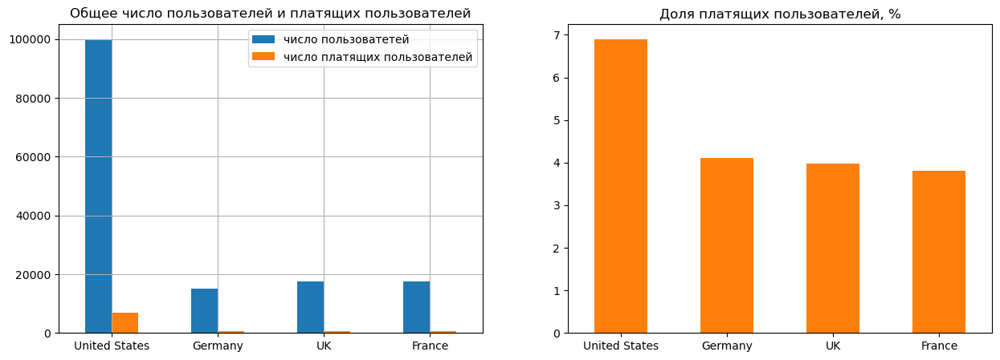

In [26]:
# Функция, строящая графики соотношения общего числа пользователей и платящих пользователей
def users_per_dimention(df, dimention, rot1=0, rot2=0):
    
    result = user_profiles.groupby(dimention).agg({'user_id': 'nunique', 'payer': 'sum'})
    result.columns = ['n_users', 'n_payers']
    result['payers_per_dimention, %'] = result['n_payers'] / result['n_users'] * 100
    result = result.sort_values(by='payers_per_dimention, %', ascending=False)
    display(result)

    plt.figure(figsize=(15, 5))

    ax1=plt.subplot(1, 2, 1)
    result[['n_users', 'n_payers']].plot.bar(ax=ax1, grid=True, rot=rot1)
    plt.legend(['число пользоватетей','число платящих пользователей'])
    plt.xlabel('')
    plt.title('Общее число пользователей и платящих пользователей')

    ax2=plt.subplot(1, 2, 2)
    result[['payers_per_dimention, %']].plot.bar(ax=ax2, legend=None, rot=rot2, color='#ff7f0e')
    plt.xlabel('')
    plt.xticks(ticks=range(len(result.index)), labels=result.index)
    plt.title('Доля платящих пользователей, %')
    plt.show()
    
    return result # на случай, если нам понадобится эта таблица в будущем

# рассчитаем долю платящих пользователей по странам
users_per_country = users_per_dimention(user_profiles, 'region')

США выглядят самым успешным регионом: там самые высокие показатели привлечения пользователей и общий показатель конверсии за весь рассматриваемый период (конверсия выше в среднем на 3 п.п. по сравнению с остальными регионами. Во Франции, Германии и Великобритании показатели в целом схожи. Из этих трех стран в Германии меньше общее количество привлеченных пользователей, однако выше показатель общей конверсии.

#### Устройства

,n_users,n_payers,"payers_per_dimention, %"
device,,,
Mac,30042,1912,6.364423
iPhone,54479,3382,6.207897
Android,35032,2050,5.851793
PC,30455,1537,5.046790


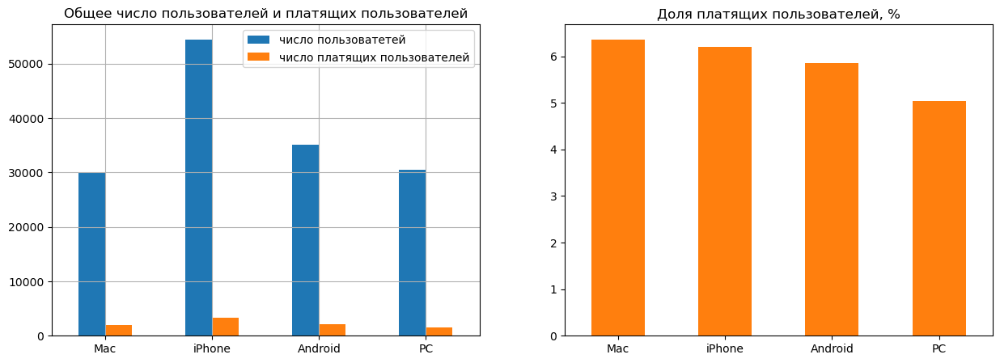

In [27]:
user_per_device = users_per_dimention(user_profiles, 'device')

Наибольшее число пользователей и платящих пользователей впервые вопрользовались приложением с iPhone, на втором месте устройства на Android, за ним следуют PC и Mac. В целом ожидаемо больше привлеченных пользователей пользовались мобильными платформами (iPhone, Android), нежели стационарными (PC, Mac). 

Также следует отметить более высокую общую конверсию за исследуемый период показывают пользователи, пользующиеся продукцией компании Apple (iPhone, Mac) - для обеих платформ она выше отметки 6.2%. Показатель конверсии для пользователей Android составляет 5.85%, самый низкий показатель у PC - 5%.

#### Рекламные каналы

,n_users,n_payers,"payers_per_dimention, %"
channel,,,
FaceBoom,29144,3557,12.204914
AdNonSense,3880,440,11.340206
lambdaMediaAds,2149,225,10.469986
TipTop,19561,1878,9.600736
RocketSuperAds,4448,352,7.913669
WahooNetBanner,8553,453,5.296387
YRabbit,4312,165,3.826531
MediaTornado,4364,156,3.574702
LeapBob,8553,262,3.063253


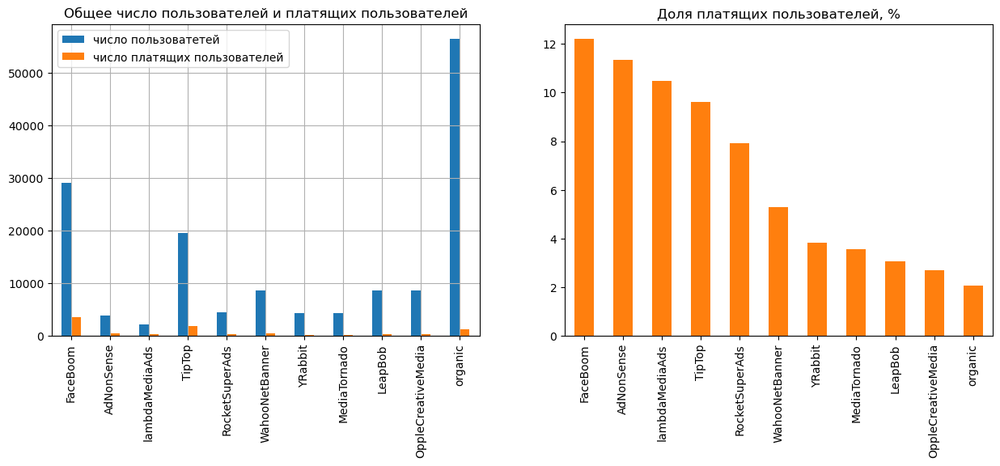

In [28]:
user_per_device = users_per_dimention(user_profiles, 'channel', rot1=90, rot2=90)

Больше всего пользователей пришли сами, однако у этой категории ожидаемо самый низкий процент конверсии - 2%. 

* Топ-3 платных канала по общему числу привлеченных пользователей: **FaceBoom, Tip-Tip, OppleCreativeMedia**. При этом OppleCreativeMedia - явный аутсайдер среди платных каналов по показателю конверсии - все 2,7%. При 8605 привлеченных пользователей платящими стали всего 233.
* Топ-3 платных канала по общему числу платящих пользователей: **FaceBoom, Tip-Tip, WahooNetBanner**, при этом FaceBoom сильно отрывается от остальных каналов.
* Топ-3 платных канала по показателю общей конверсии: **FaceBoom, AdNonSense, lambdaMediaAds**. Во всех трех случаях показатель выше 10%.

### Анализ данных по маркетингу

In [29]:
total_costs = costs.groupby('channel').agg({'costs': 'sum'}).reset_index().sort_values(by='costs', ascending=False).reset_index(drop=True)
display(f'Общая сумма трат на маркетинг: {total_costs["costs"].sum():.2f}')

'Общая сумма трат на маркетинг: 105497.30'

,channel,costs
0,TipTop,54751.30
1,FaceBoom,32445.60
2,WahooNetBanner,5151.00
3,AdNonSense,3911.25
4,OppleCreativeMedia,2151.25
5,RocketSuperAds,1833.00
6,LeapBob,1797.60
7,lambdaMediaAds,1557.60
8,MediaTornado,954.48
9,YRabbit,944.22


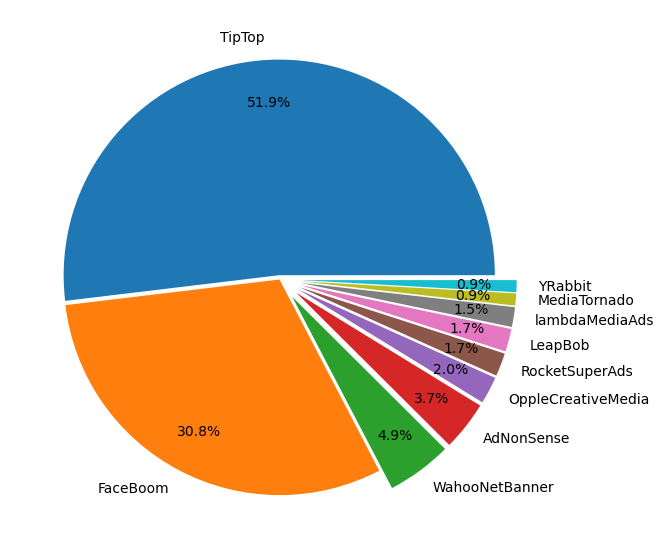

In [30]:
display(total_costs)
plt.figure(figsize=(7, 7))

plt.pie(list(total_costs['costs']), 
        autopct='%1.1f%%', 
        pctdistance=0.8, 
        labels=[x for x in list(total_costs['channel'])],
        explode=[0.02, 0, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1]
       )
plt.show()

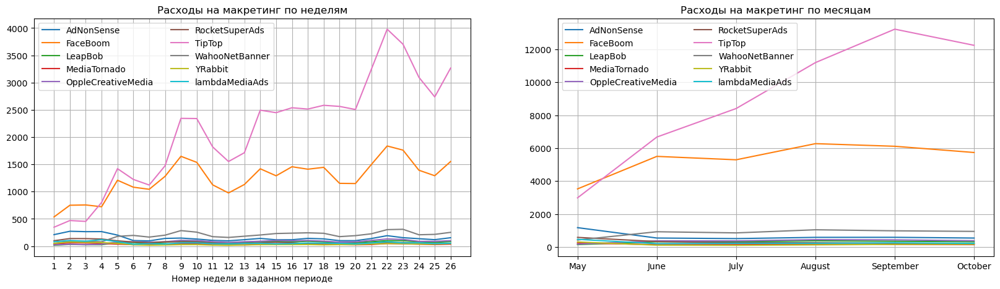

In [31]:
import calendar as cal

costs['dt'] = pd.to_datetime(costs['dt'])
costs['dt_week'] = costs['dt'].dt.isocalendar().week
costs['dt_month'] = costs['dt'].dt.month

plt.figure(figsize=(20, 5))

# цвета понадобятся нам в дальнейшем, чтобы они не менялись от графика к графику
line_colors = [p['color'] for p in plt.rcParams['axes.prop_cycle']] 

ax1=plt.subplot(1, 2, 1)
costs_per_week = costs.pivot_table(index='dt_week',
                                   columns='channel',
                                   values='costs',
                                   aggfunc='sum'
                                  )
costs_per_week.plot(grid=True, color=line_colors, ax=ax1)
plt.xticks(ticks=costs['dt_week'].unique(), 
           labels=[str(x+1) for x in range(costs['dt_week'].nunique())] # считаем недели в рамках периода, начиная с первой
          )
plt.title('Расходы на макретинг по неделям')
plt.xlabel('Номер недели в заданном периоде')
plt.legend(loc='upper left', ncol=2)

ax2=plt.subplot(1, 2, 2)
costs_per_month = costs.pivot_table(index='dt_month',
                                   columns='channel',
                                   values='costs',
                                   aggfunc='sum'
                                  )
costs_per_month.plot(grid=True, color=line_colors, ax=ax2)
plt.xticks(ticks=costs['dt_month'].unique(), 
           labels=[cal.month_name[x] for x in costs['dt_month'].unique()] # меняем номера месяцев на их названия
          )
plt.title('Расходы на макретинг по месяцам')
plt.xlabel('')
plt.legend(loc='upper left', ncol=2)
plt.show()

Общая сумма трат на маркетинг составила $105497.30. На графиках видно, что большая часть бюджета уходит на привлечение клиентов через TipTop и FaceBoom - более 80% от общих затрат. При этом расходы расходы на TipTop большую часть времени росли, в то время как расходы на FaceBoom после начального роста (до 9 недели) остаются достаточно стабильными и не показывают существенного роста.

Рассмотрим остальные каналы привлечения пользователей более подробно.

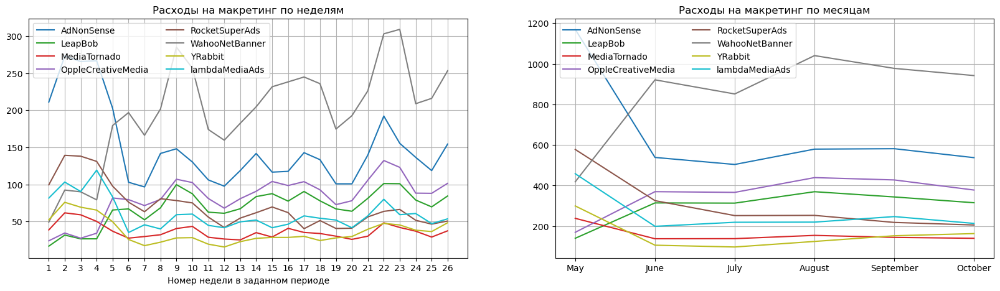

In [32]:
plt.figure(figsize=(20, 5))

ax1=plt.subplot(1, 2, 1)
costs_per_week = costs.query('channel not in ["FaceBoom", "TipTop"]').pivot_table(index='dt_week',
                                                                                  columns='channel',
                                                                                  values='costs',
                                                                                  aggfunc='sum'
                                                                                 )

costs_per_week.plot(grid=True, 
                    color=[x for x in line_colors if line_colors.index(x) not in [1, 6]], 
                    ax=ax1
                   )
plt.xticks(ticks=costs['dt_week'].unique(), 
           labels=[str(x+1) for x in range(costs['dt_week'].nunique())]
          )
plt.title('Расходы на макретинг по неделям')
plt.xlabel('Номер недели в заданном периоде')
plt.legend(loc='upper left', ncol=2)

ax2=plt.subplot(1, 2, 2)
costs_per_month = costs.query('channel not in ["FaceBoom", "TipTop"]').pivot_table(index='dt_month',
                                                                                   columns='channel',
                                                                                   values='costs',
                                                                                   aggfunc='sum'
                                                                                  )

costs_per_month.plot(grid=True, color=[x for x in line_colors if line_colors.index(x) not in [1, 6]], ax=ax2)
plt.xticks(ticks=costs['dt_month'].unique(), 
           labels=[cal.month_name[x] for x in costs['dt_month'].unique()]
          )
plt.title('Расходы на макретинг по месяцам')
plt.xlabel('')
plt.legend(loc='upper left', ncol=2)
plt.show()

Из оставшихся 8 каналов привлечения за исследуемый период расходы **возросли для трех: WahooNetBanner, OppleCreativeMedia и LeapBob**. При этом расходы на остальные 5 каналов были выше в мае, после чего резко снизились в июне и не восстановились до исходных значений. Стоит отметить, что 2 из 3 каналов, расходы на которые возросли, показывают очень низкий общий показатель конверсии (OppleCreativeMedia - 2,7% и LeapBob - 3%, ниже конверсия только у "бесплатных" пользователей), в то время как последний из тройки - WahooNetBanner, занимает по показателю общей конверсии лишь 6-ю строчку.

Также стоит отметить **общее почти для всех снижение между 22-й и 25-й неделями** рассматриваемого периода (исключение составляют расходы на WahooNetBanner, однако там снижение произошло более резко в рамках одной 24-й недели. Этот временной промежуток приходится на конец сентября и начало-середину октября. В последнюю неделю рассматриваемого периода наблюдается рост расходов на все каналы привлечения. 

,channel,total_costs,n_users,avg_cac
0,TipTop,54751.3,19561,2.799003
1,total,105497.3,93569,1.127481
2,FaceBoom,32445.6,29144,1.113286
3,AdNonSense,3911.25,3880,1.008054
4,lambdaMediaAds,1557.6,2149,0.724802
5,WahooNetBanner,5151.0,8553,0.602245
6,RocketSuperAds,1833.0,4448,0.412095
7,OppleCreativeMedia,2151.25,8605,0.25
8,YRabbit,944.22,4312,0.218975
9,MediaTornado,954.48,4364,0.218717


Text(0.5, 1.0, 'Стоимость привлечения пользователей по каналам')

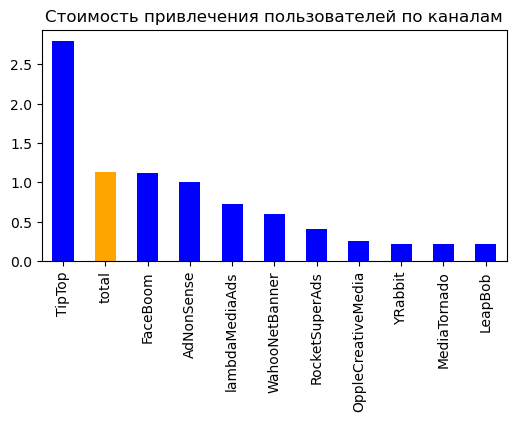

In [33]:
channel_average_cac = user_profiles.groupby('channel').agg({'acquisition_cost': 'sum', 'user_id': 'nunique'})
channel_average_cac.columns = ['total_costs', 'n_users']
channel_average_cac['avg_cac'] = channel_average_cac['total_costs'] / channel_average_cac['n_users']
channel_average_cac = channel_average_cac.query('channel != "organic"').reset_index()
avg_cac = pd.Series({'channel':'total',
                     'total_costs': channel_average_cac['total_costs'].sum(), 
                     'n_users': channel_average_cac['n_users'].sum(), 
                     'avg_cac': (channel_average_cac['total_costs'].sum() / channel_average_cac['n_users'].sum())
                    }
                   )
channel_average_cac = pd.concat([channel_average_cac, avg_cac.to_frame().T], ignore_index=True)
channel_average_cac = channel_average_cac.sort_values(by='avg_cac', ascending=False).reset_index(drop=True)
display(channel_average_cac)

plt.figure(figsize=(6,3))
channel_average_cac.set_index('channel')['avg_cac'].plot.bar(rot=90, color=['blue', 'orange', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue'])
plt.xlabel('')
plt.title('Стоимость привлечения пользователей по каналам')

У **TipTop самая высокая стоимость привлечения**, при этом по количеству привлеченных пользователей этот канал занимает 2-е место после FaceBoom. При этом стоимость привлечения через FaceBoom в 2 раза ниже. При достаточно высокой общей конверсии (TipTop занимает 4-е место по этому показателю, почти 10%) такая высокая стоимость может быть оправдана при достаточно высоком качестве привлекаемых клиентов (высокий показатель удержания и LTV).

### Окупаемость рекламы

#### Общие LTV, ROI и CAC

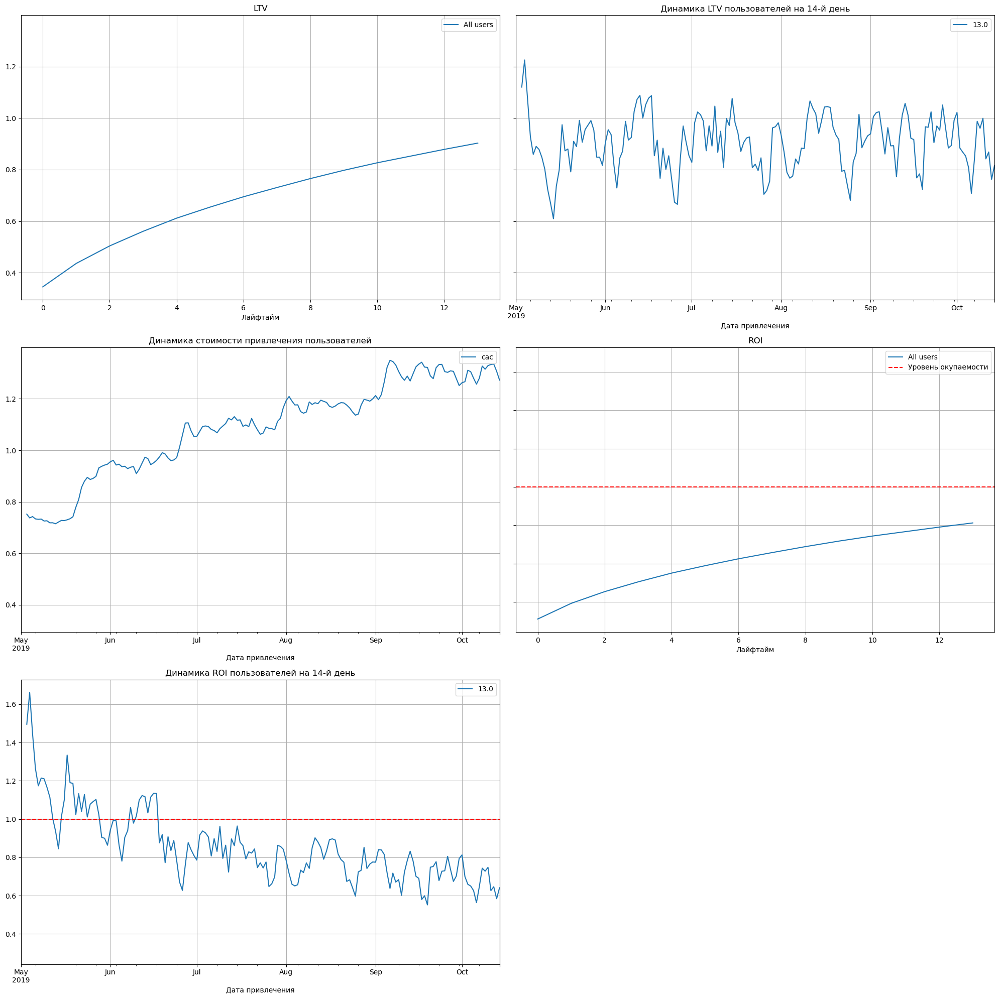

In [34]:
observation_date = datetime(2019, 10, 27)
horizon_days = 14

ltv_result_raw, ltv, ltv_history, roi, roi_history = get_ltv(user_profiles.query('channel != "organic"'),
                                                             orders,
                                                             observation_date,
                                                             horizon_days,
                                                             dimensions=[],
                                                             ignore_horizon=False
                                                            )

plot_ltv_roi(ltv, ltv_history, roi, roi_history, 14, window=3)

На общей динамике LTV на 14-й день видно, что, за исключением мая, этот показатель не показыват тенденции к росту или падению, большую часть времени находясь в пределах 0.7-1.1$ на одного привлеченного пользователя. В то же время динамика CAC показывает уверенный рост на протяжении почти всего периода (со второй декады сентября он прекратился, и затраты на рекламу не показывают устойчивой тенденций ни к росту, ни к уменьшению). Показанные выше графики расходов по каналам привлечения позволяют предположить, что рост CAC связан с увеличением расходов на привлечение через TipTop - через этот канал привлечено достаточно много пользователей пользователей, однако и стоимость привлечения одного клиента там самая высокая.

При стабильном общем LTV и растущем CAC логично, что ROI в течение исследумого периода будет снижаться. С середины июня расходы на маркетинг стабильно не окупаются. Если при расчете расходов использовалась упрощенная формула, не учитывающая з/п сотрудников отдела маркетинга, себестоиомсть предоставляемых услуг и т.п., то точка убыточности, вероятно, была пройдена ещё раньше.

#### Общие конверсия и удержание пользователей

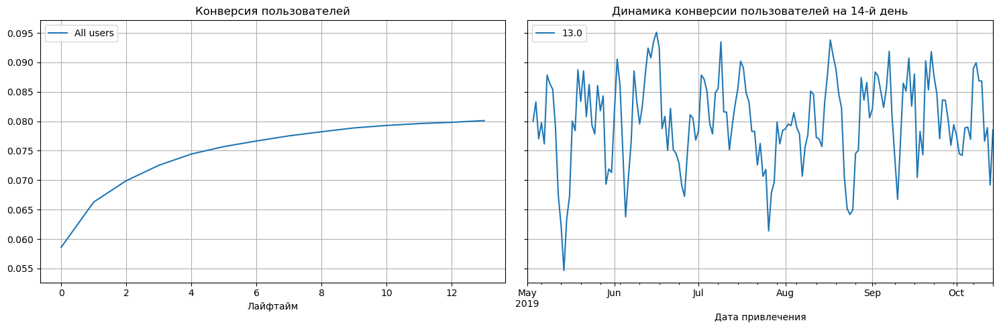

In [35]:
conversion_raw, conversion, conversion_history = get_conversion(user_profiles.query('channel != "organic"'),
                                                                orders,
                                                                observation_date,
                                                                horizon_days,
                                                                dimensions=[],
                                                                ignore_horizon=False,
                                                               )

plot_conversion(conversion, conversion_history, 14, window=3)

В среднем конверсия пользователей, пришедших через платные каналы, на 14-й день составляет около 8%. При этом динамика конверсии, как и динамика LTV, не показывает тенденции ни к росту, ни к падению, с начала июня колеблясь в рамках коридора 7-9% и редко выходя за эти рамки.

На данный момент мы видим, что ни конверсия, ни LTV не выросли при увеличении средней стоимости привлечения пользователей. Взглянем на показатель удержания.

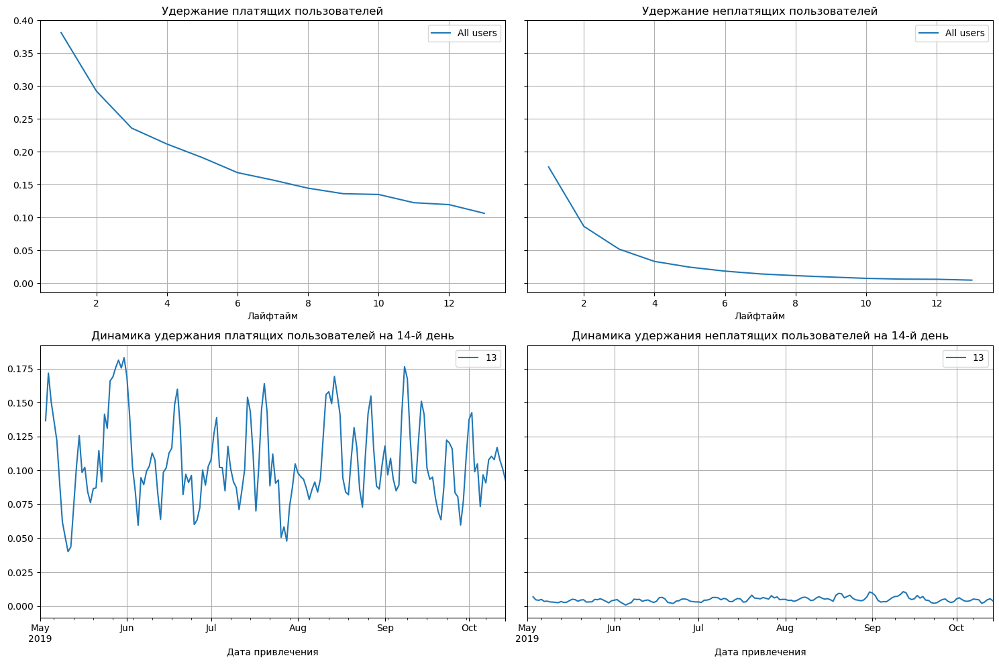

In [36]:
retention_raw, retention, retention_history = get_retention(user_profiles.query('channel != "organic"'),
                                                            visits,
                                                            observation_date,
                                                            horizon_days,
                                                            dimensions=[],
                                                            ignore_horizon=False,
                                                           )

plot_retention(retention, retention_history, 14, window=3)

Общее удержание платящих пользователей, привлеченных через рекламу, ожидаемо выше удержания неплатящих. Динамика удержания платящих пользователей на 14-й день показывает достаточно большой разброс (от менее 7% до 18%), однако в то же время не показывает глобальной тенденции ни к росту, ни к падению, за редким исключением оставаясь в коридоре 7.5-17%.

#### Распределение по устройствам

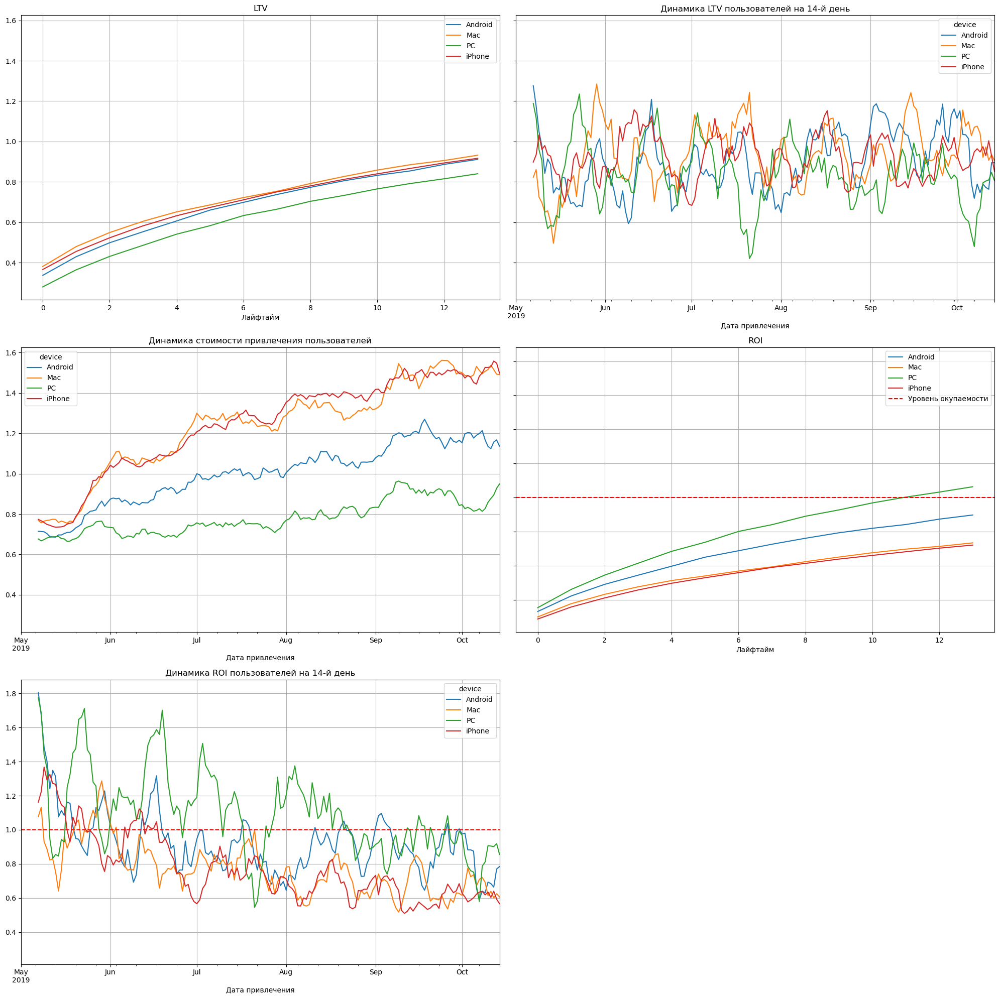

In [37]:
ltv_result_raw, ltv, ltv_history, roi, roi_history = get_ltv(user_profiles.query('channel != "organic"'),
                                                             orders,
                                                             observation_date,
                                                             horizon_days,
                                                             dimensions=['device'],
                                                             ignore_horizon=False
                                                            )

plot_ltv_roi(ltv, ltv_history, roi, roi_history, 14, window=7)

Для всех устройств корелляции роста LTV и длительности лайфтайма схожи. К 14-му дню LTV пользователей Mac чуть выше, чем LTV пользователей с Android  и iPhone. Чуть сильнее отстает PC. Однако стоимость привлечения пользователей на PC и Android значительно ниже - для пользователей продукции компании Apple к концу периода она превысила 1.5$, в то время как для Android этот показатель почти никогда не превышал 1.2, а для PC - 1. Из четырех перечисленных платформ только PC преодолел порог окупаемости. 

В течение исследуемого периода стоимость привлечения росла, что при стабильном показателе LTV привело к снижению ROI. iPhone и Mac стали стабильно убыточными уже в июне, Android на пиках выходил в зону прибыли на протяжени всего периода, однако глобально также был убыточным. Лучшие результаты продемострировали пользователи PC, однако и здесь был мощный тренд на снижение ROI, который к концу периода привел к убыточности.

Поскольку все платформы показывают тенденцию к снижению ROI, можно предположить, что устройство не оказывает значительного влияния на динамику этого показателя.

<Figure size 2000x500 with 0 Axes>

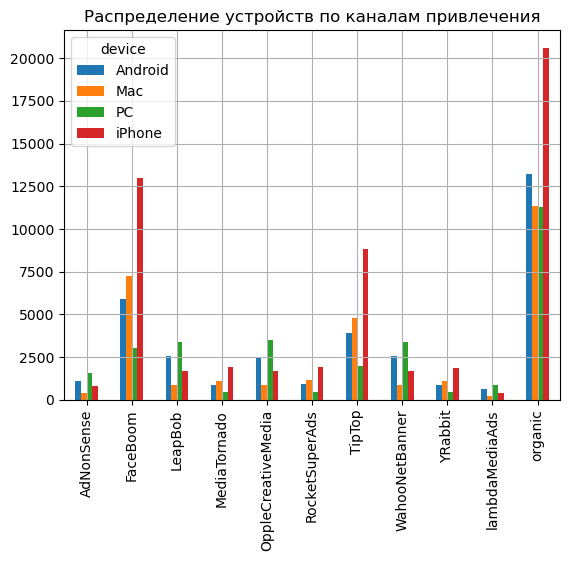

In [38]:
plt.figure(figsize=(20,5))

user_profiles.pivot_table(index='channel',
                          columns='device',
                          values='user_id',
                          aggfunc='nunique'
                         ).plot.bar(grid=True)
plt.title('Распределение устройств по каналам привлечения')
plt.xlabel('')
plt.show()

Действительно, пользователи Mac и iPhone, которые показывают более низкие показатели ROI, приходят в основном из каналов с высоким CAC. Дополнительно проверим удержание и конверсию, а также медианную продолжительность сессий для каждого устройства. 

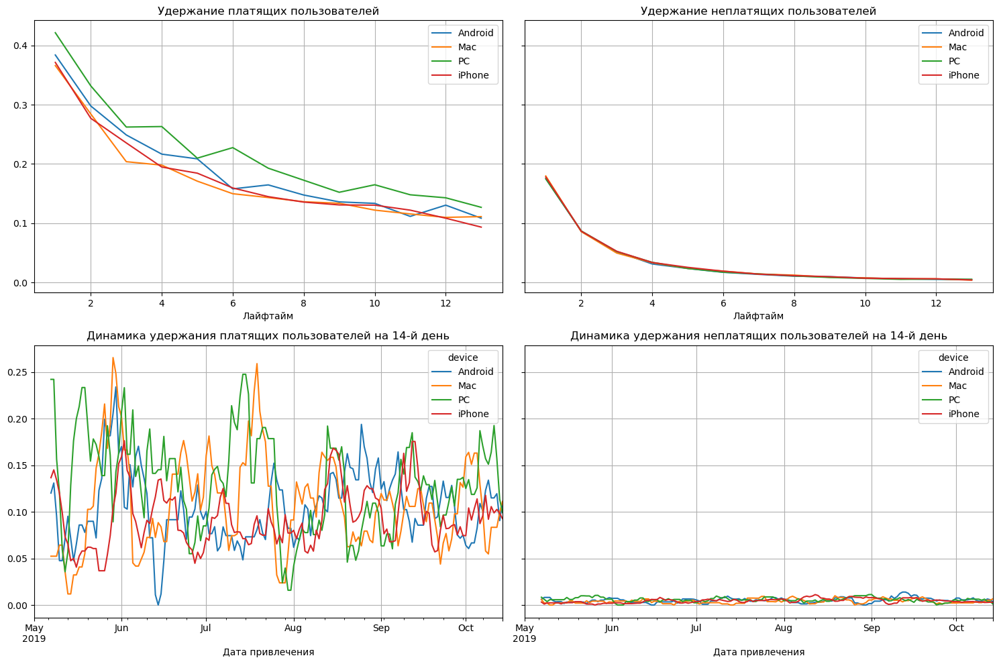

In [39]:
retention_raw, retention, retention_history = get_retention(user_profiles.query('channel != "organic"'),
                                                            visits,
                                                            observation_date,
                                                            horizon_days,
                                                            dimensions=['device'],
                                                            ignore_horizon=False,
                                                           )

plot_retention(retention, retention_history, 14, window=7)

В первый месяц динамика удержания на платящих пользователей с PC и Mac была в среднем лучше, чем у мобильных платформ, однако во второй половине рассматриваемого периода (с начала августа) показатели всех устройств вошли в коридор 5-20% и колеблются внутри этих границ. Также стоит отметить, что  мобильные платформы (Android и iPhone) изначально были в этом коридоре и практически не покидают его, в то время как стационарные платформы (Mac и PC) в начале исследуемого периода показывали более высокие показатели удержания.

Посмотрим графики удержания пользователей, разделив их на две дополнительные категории: тех, кто использовал разные устройства, и тех, кто использовал одно.

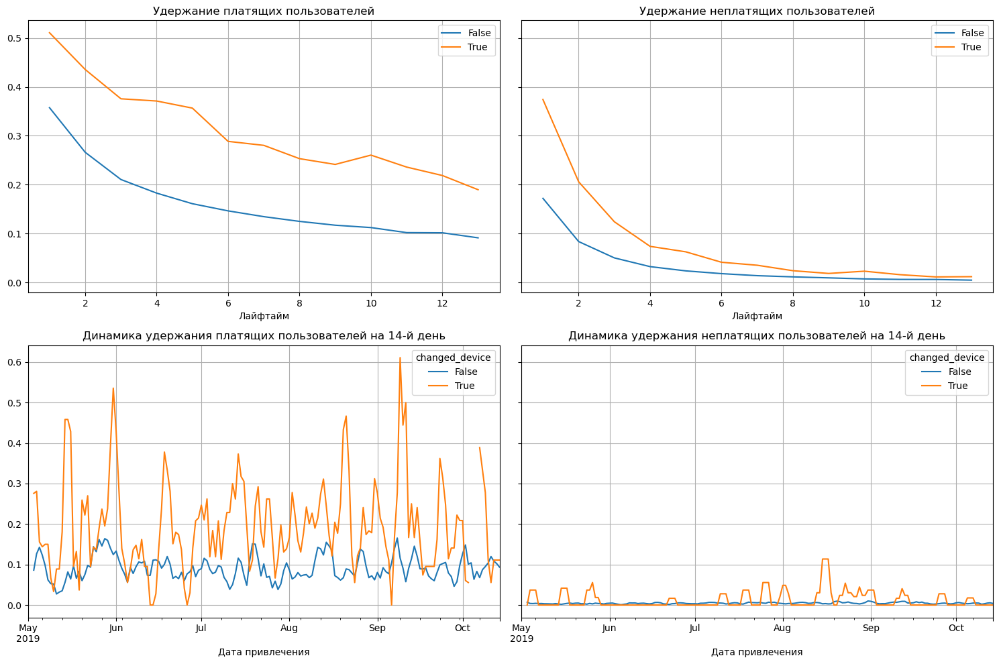

user_id
payer changed_device         
False False             83720
      True               2128
True  False              6577
      True               1144

In [40]:
# получаем число использованных (от 1 до 4)
device_users = user_profiles.query('channel != "organic"').merge(visits.groupby('user_id').agg({'device': 'nunique'}), on='user_id', how='left')
device_users.rename(columns={'device_x': 'device', 'device_y': 'n_devices'}, inplace=True)

# если число больше 1, пользователь менял платформу
device_users['changed_device'] = device_users['n_devices'].isin([2, 3, 4])

device_retention_raw, device_retention, device_retention_history = get_retention(device_users,
                                                                                 visits,
                                                                                 observation_date,
                                                                                 horizon_days,
                                                                                 dimensions=['changed_device'],
                                                                                 ignore_horizon=False,
                                                                                )

plot_retention(device_retention, device_retention_history, 14, window=3)

device_users.groupby(['payer', 'changed_device']).agg({'user_id': 'nunique'})

Удержание платящих пользователей, которые меняли платформу, стабильно лучше (для 14-го дня это 19% против 9%). Возможны несколько вариантов: 
* на одном из устройств приложение работает лучше, чем на других, поэтому переключение между устройствами увеличивает шансы пользователя попасть на более "удачную" версию приложения;
* на различных платформах по-разному реализован функционал, поэтому переключение между устройствами позволяет пользователю найти более удобный для себя вариант;
* пользователи, которых заинтересовало приложение, проводят в нем больше времени, поэтому шансы, что они зайдут на него с разных устройств (компьютера на работе или дома, смартфона в дороге) повышаются. В этом случае несколько устройств - не причина более более высокого удержания.

Проверить, какой из вариантов более вероятен, на основании имеющихся данных невозможно. 

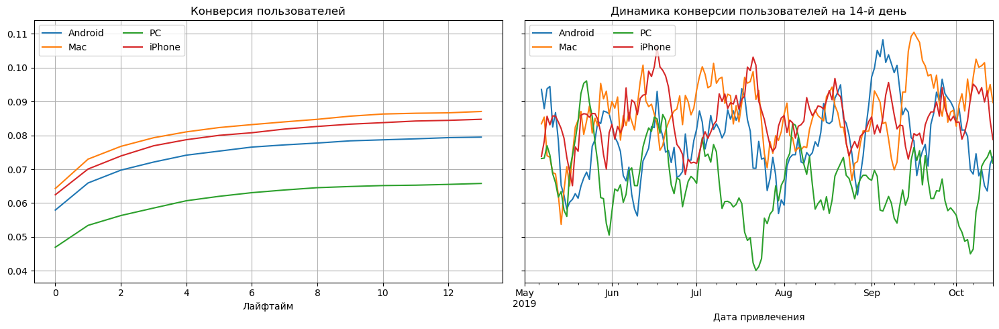

In [41]:
conversion_raw, conversion, conversion_history = get_conversion(user_profiles.query('channel != "organic"'),
                                                                orders,
                                                                observation_date,
                                                                horizon_days,
                                                                dimensions=['device'],
                                                                ignore_horizon=False,
                                                               )

plot_conversion(conversion, conversion_history, 14, window=7)

При этом показатель конверсии у PC хуже, чем у остальных устройств. Конверсия всех устройств достаточно стабильна - начиная с июня, глобально не показывает ни улучшения, ни ухудшения.

<AxesSubplot:title={'center':'Медианная продолжительность сессии'}>

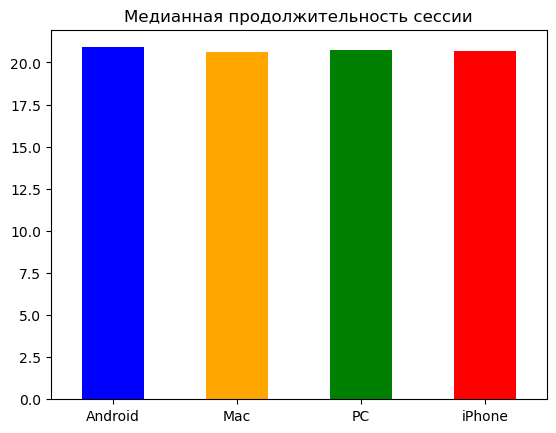

In [42]:
visits['session_duration'] = (visits['session_end'] - visits['session_start']).dt.seconds / 60
session_by_device = visits.groupby('device').agg({'session_duration': 'median'})
session_by_device['session_duration'].plot.bar(title='Медианная продолжительность сессии', xlabel='', rot=0, color=['blue', 'orange', 'green', 'red'])

Медианная продолжительность сессии для различных устройств практически не отличается. Вероятнее всего, тип устройства существенно не влияет на показатели.

#### Распределение по регионам

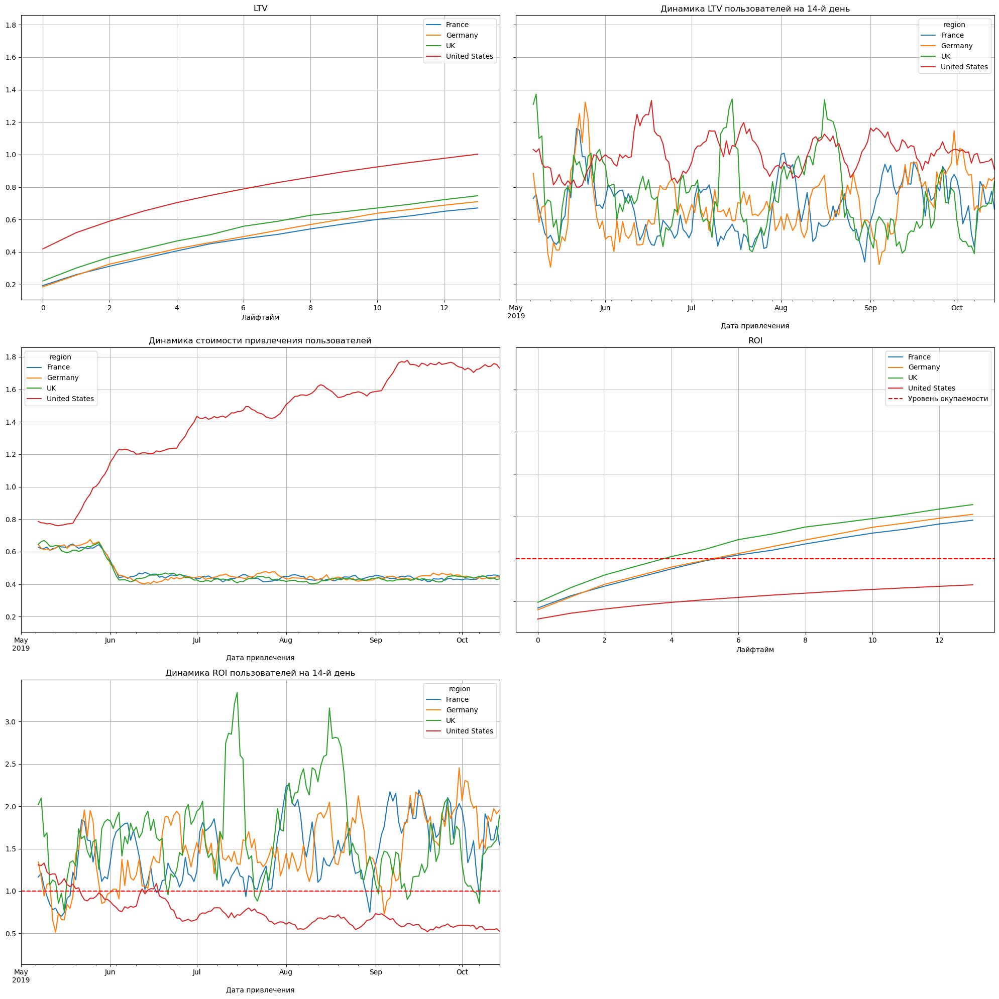

In [43]:
ltv_result_raw, ltv, ltv_history, roi, roi_history = get_ltv(user_profiles.query('channel != "organic"'),
                                                             orders,
                                                             observation_date,
                                                             horizon_days,
                                                             dimensions=['region'],
                                                             ignore_horizon=False
                                                            )

plot_ltv_roi(ltv, ltv_history, roi, roi_history, 14, window=7)

У пользователей из США самый высокий LTV, однако при этом и самый высокий показатель CAC, из-за чего США - единственная страна, пользователи которой не окупаются к 14-му дню. При этом CAC пользователей из США показывает уверенный рост, в то время как стоимость привлечения пользователей из Европы сильно сократились в конце мая - начале июня и с тех пор остается стабильной. 

Вероятно, это также связано с тем, что клиенты из США привлекаются через самые дорогие каналы, а их доля от общего числа пользователей значительно выше.

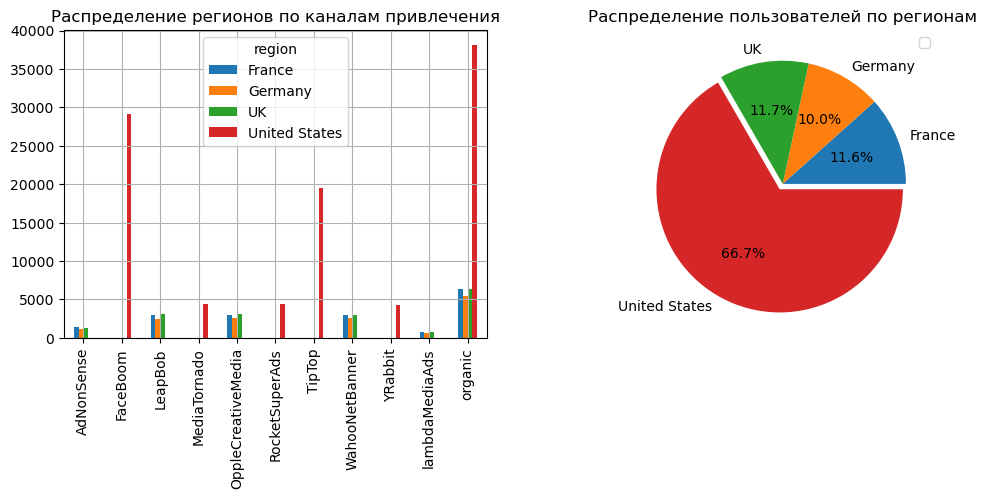

In [44]:
plt.figure(figsize=(12,4))

ax1=plt.subplot(1, 2, 1)
user_profiles.pivot_table(index='channel',
                          columns='region',
                          values='user_id',
                          aggfunc='nunique'
                         ).plot.bar(grid=True, ax=ax1)
plt.title('Распределение регионов по каналам привлечения')
plt.xlabel('')

ax2=plt.subplot(1, 2, 2)
user_profiles.groupby('region').agg({'user_id': 'nunique'}).plot.pie(subplots=True, 
                                                                     ax=ax2, 
                                                                     autopct='%1.1f%%',
                                                                     explode=[0, 0, 0, 0.05]
                                                                    )
plt.ylabel('')
plt.legend('')
plt.title('Распределение пользователей по регионам')
plt.show()

Действительно, на США приходится 2/3 всех пользователей, при этом они привлекаются в основном через TipTop и FaceBoom  - каналы с самой большой стоимостью привлечения. Стоит отметить, что каналы разделяются на две категории: 
* через первую (TipTop, FaceBoom, YRabbit, MediaTornado, RocketSuperAds) привлекаются пользователи из США;
* через вторую (AdNonSense, LeapBob, OppleCreativeMedia, WahooNetBanner, lambdaMediaAds) - пользователи из Европы.

Проверим удержание и конверсию по странам.

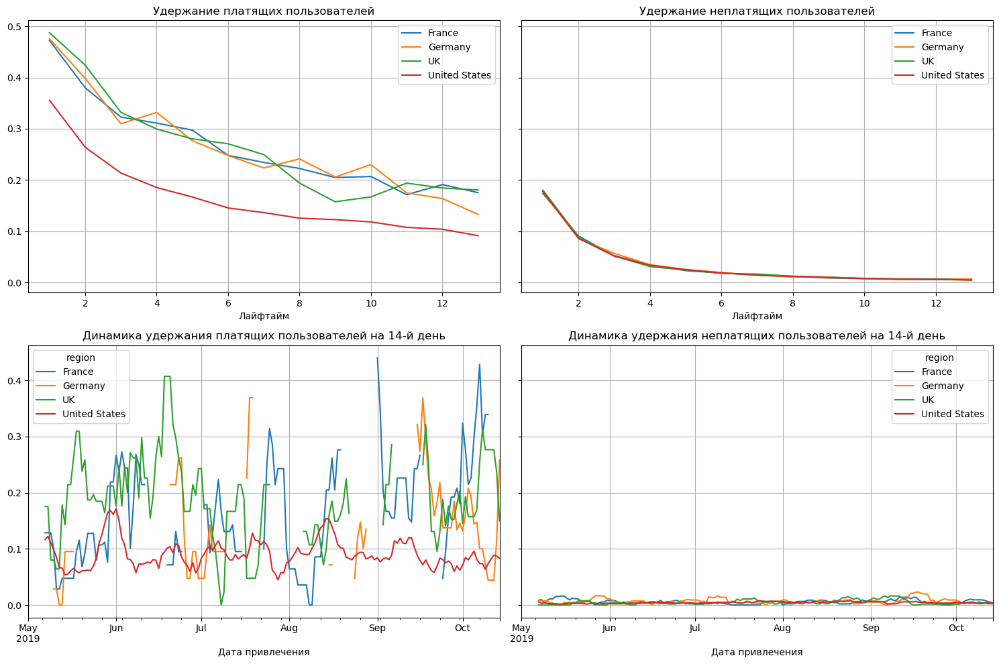

In [45]:
retention_raw, retention, retention_history = get_retention(user_profiles.query('channel != "organic"'),
                                                            visits,
                                                            observation_date,
                                                            horizon_days,
                                                            dimensions=['region'],
                                                            ignore_horizon=False,
                                                           )

plot_retention(retention, retention_history, 14, window=7)

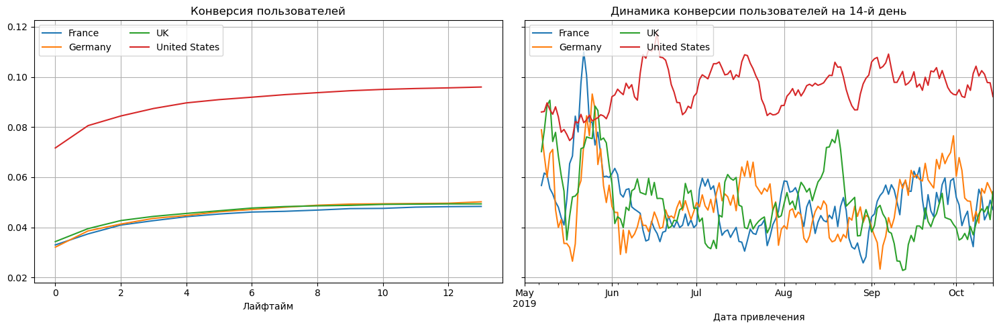

In [46]:
conversion_raw, conversion, conversion_history = get_conversion(user_profiles.query('channel != "organic"'),
                                                                orders,
                                                                observation_date,
                                                                horizon_days,
                                                                dimensions=['region'],
                                                                ignore_horizon=False,
                                                               )

plot_conversion(conversion, conversion_history, 14, window=7)

Конверсия пользователей из США стабильно лучше, а удержание платящих пользователей - стабильно хуже других стран. 

In [47]:
# проверим, когда в среднем пользователи из разных стран совершают первую покупку
# определяем дату первого платежа и добавляем в профиль пользователя, оставляем только плательщиков
first_order = user_profiles.merge(orders.groupby('user_id').agg({'event_dt': 'min'}), on='user_id', how='right')
# определяем лайфтайм первой покупки
first_order['lifetime'] = (first_order['event_dt'] - first_order['first_ts']).dt.days
# группируем по регионам и вычисляем средний лайфтайм первой покупки
display(first_order.groupby('region').agg({'lifetime': 'mean'}))

,lifetime
region,
France,1.897436
Germany,1.649351
UK,1.768571
United States,1.681686


При этом мы видим, что платящие пользователи из разных стран совершуют первую покупку в среднем на 1-2 день после регистрации. 
Проверим, как часто платящие пользователи из разных стран совершают повторные покупки и какая средняя сумма заказа.

In [48]:
# сгруппирует orders по user_id и посчитаем количество заказов и общую сумму трат на одного пользователя, добавим эту информацию в профиль
mult_orders = (user_profiles
               .query('channel != "organic"')
               .merge(orders.groupby('user_id').agg({'event_dt': 'count', 'revenue': 'sum'}), on='user_id', how='inner')
              )
mult_orders.groupby('region').agg({'user_id': 'nunique', 'event_dt': 'mean', 'revenue': 'mean'})

,user_id,event_dt,revenue
region,,,
France,554,5.736462,30.801841
Germany,490,5.657143,29.578122
UK,569,6.035149,33.415923
United States,6108,3.626555,19.444088


<AxesSubplot:title={'center':'Медианная продолжительность сессии'}>

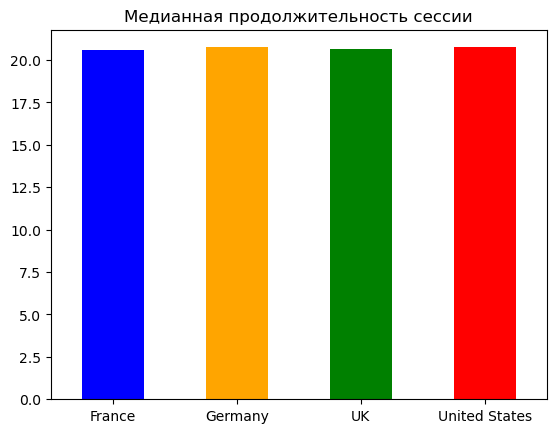

In [49]:
visits['session_duration'] = (visits['session_end'] - visits['session_start']).dt.seconds / 60
session_by_device = visits.groupby('region').agg({'session_duration': 'median'})
session_by_device['session_duration'].plot.bar(title='Медианная продолжительность сессии', xlabel='', rot=0, color=['blue', 'orange', 'green', 'red'])

Пользователи из **США, привлеченные через рекламу, в среднем совершают менее 4 покупкок на общую сумму около 19.5 долларов**. В то же время пользователи из **Европы совершают в среднем более 5.5 покупок на общую сумму 29-33 доллара**. 

Кроме того, медианная продолжительность сессии для всех пользователей (платящих и не платящих) практически не различается. Из этого можно предположить, что общедоступный контент приложения одинаково интересен пользователям по всех странах. 

Ранее мы видели, что удержание платящих пользователей из США ниже, чем из стан Европы. Возможно, это связано с тем, что платный контент более актуален для европейцев, чем для жителей США. Однако стоит учесть, что размеры когорт с разбивкой по странам сильно отличаются: число платящих пользователей из США превышает число платящих пользователей из любой другой страны более чем в 10 раз.

Также стоит помнить, что немалая доля пользователей из США привлекаются через FaceBoom и TipTop - возможно, качество привлекаемых через эти каналы пользователей ниже, чем из других источников.

#### Распределение по каналам привлечения

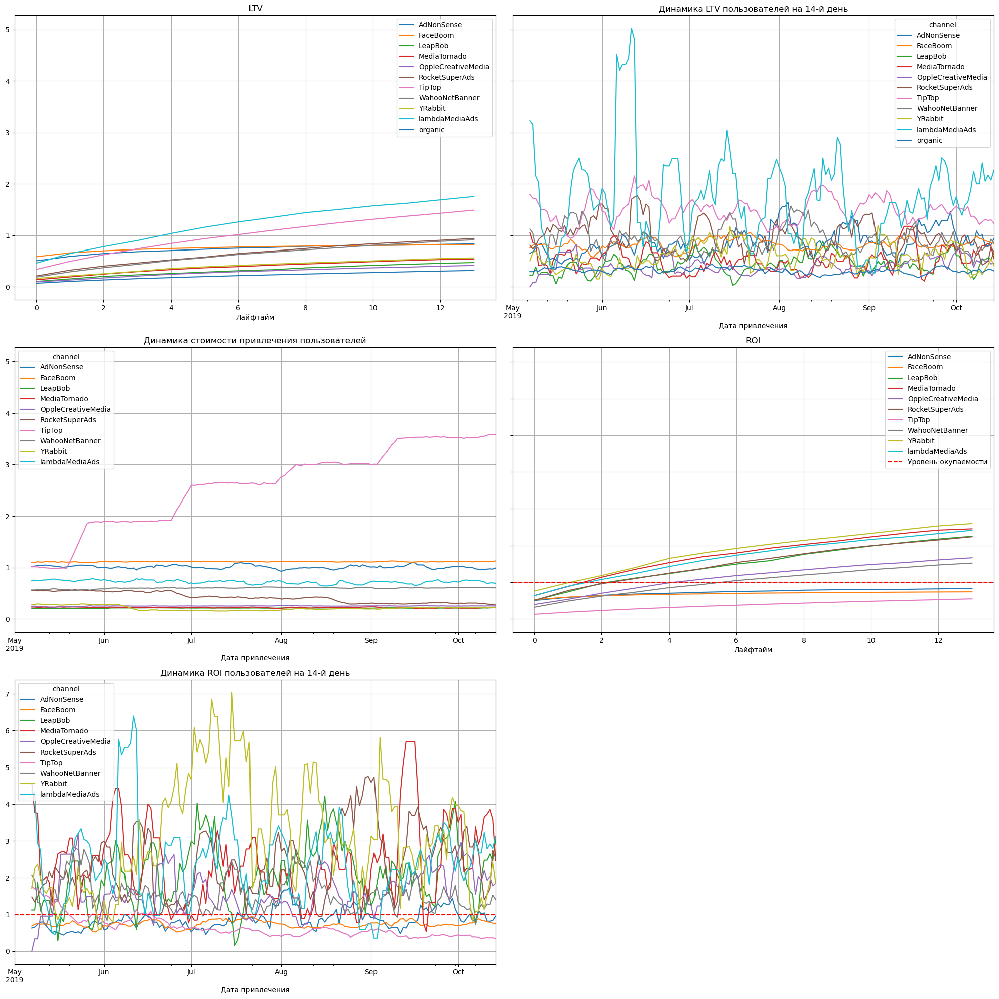

In [50]:
ltv_result_raw, ltv, ltv_history, roi, roi_history = get_ltv(user_profiles,
                                                             orders,
                                                             observation_date,
                                                             horizon_days,
                                                             dimensions=['channel'],
                                                             ignore_horizon=False
                                                            )

plot_ltv_roi(ltv, ltv_history, roi, roi_history, 14, window=7)

Три самых дорогих канала привлечения - **AdNonSense, Faceboom и TipTop (в среднем 1, 1.1 и 2.8 доллара на пользователя соответственно) не окупаются**. При этом по показателю **LTV на 14-й день только TipTop входит в превую тройку** (2-е место, уступает lambdaMediaAds), остальные два канала - AdNonSense и Faceboom - занимают 5 и 6 места соответственно. 

При этом у TipTop самая высокая стоимость привлечения - это единственный канал, который показывает устойчивую и мощную динамику роста этого показателя. Он вырос в 3.5 раза: с 1 доллара в начале исследуемого периода до 3.5 в конце. Этот рост объясняет и увеличение стоимости привлечения пользователей из США, который мы видели ранее - через Tip-Top привлекаются только пользователи из Штатов.

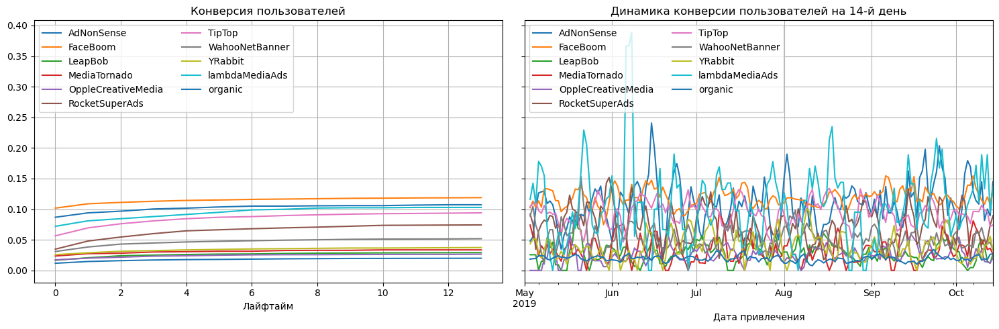

In [51]:
conversion_raw, conversion, conversion_history = get_conversion(user_profiles,
                                                                orders,
                                                                observation_date,
                                                                horizon_days,
                                                                dimensions=['channel'],
                                                                ignore_horizon=False,
                                                               )

plot_conversion(conversion, conversion_history, 14, window=3)

Динамика конверсии у большиства каналов не показывает тенденции ни к росту, ни к снижению. При этом самые высокие показатели конверсии у FaceBoom и AdNonSense, однако положительный эффект от высокой конверсии нивелируется высоким CAC.

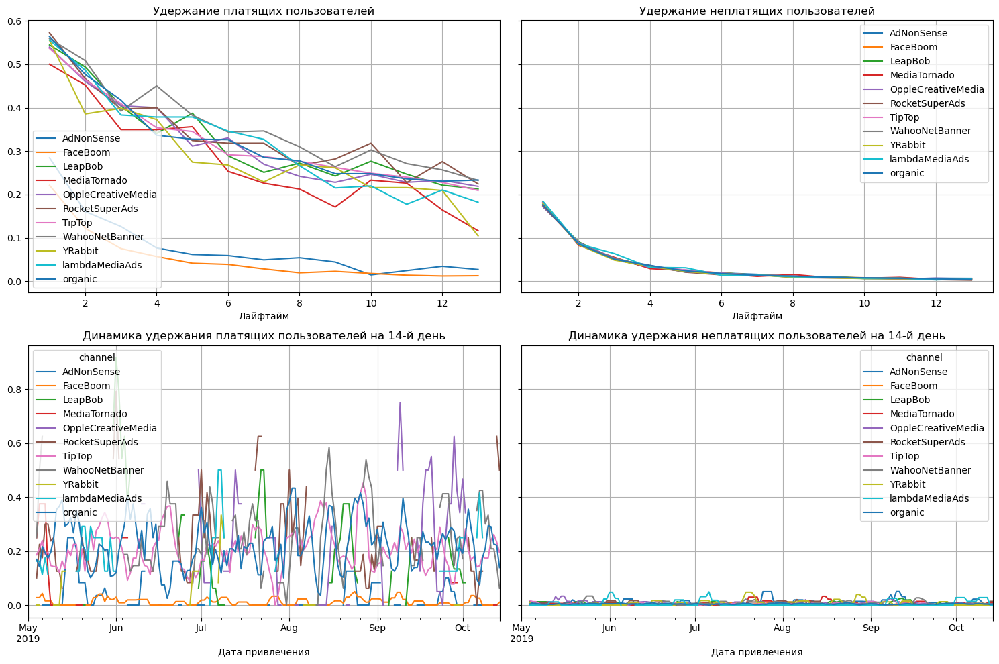

In [52]:
retention_raw, retention, retention_history = get_retention(user_profiles,
                                                            visits,
                                                            observation_date,
                                                            horizon_days,
                                                            dimensions=['channel'],
                                                            ignore_horizon=False,
                                                           )

plot_retention(retention, retention_history, 14, window=4)

У большиства каналов удержание платящих пользователей находится приблизительно на одном уровне с пользователями, пришедшими не через рекламу. В то же время особенно сильно выделяются AdNonSense и FaceBoom - удержание данных каналов к 14-му дню не превышают 4%, тогда как у остальных каналов этот показатель выше 10% (в некоторых случаях выше 20%).

#### Анализ TipTop

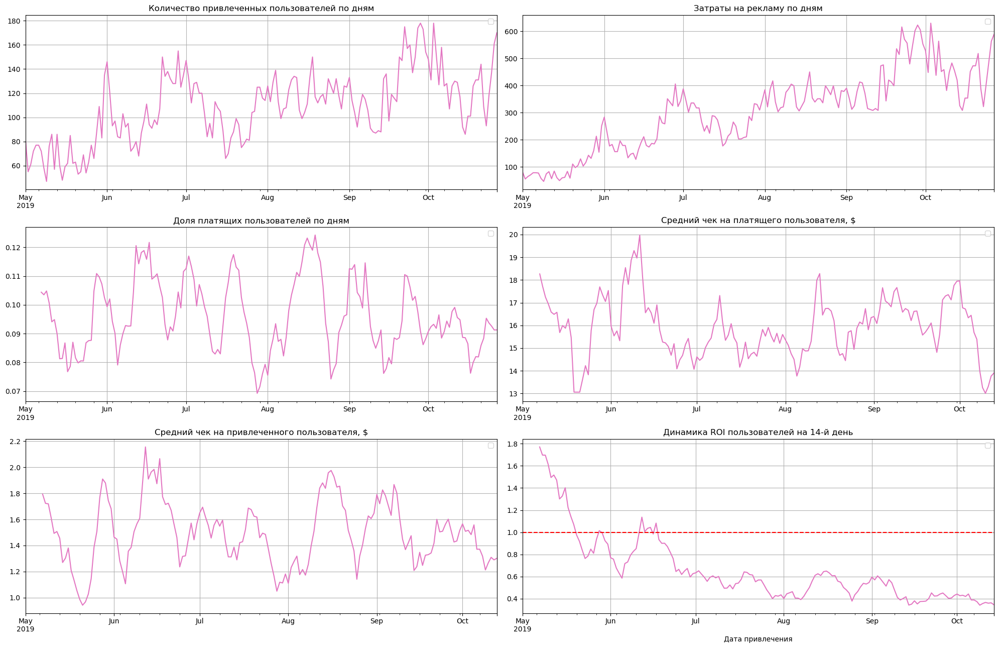

In [53]:
# для расчета среднего чека нам понадобятся лайфтаймы транзакций
# получаем лайфтайм транзакции
orders_lifetime = orders.merge(user_profiles[['user_id', 'first_ts']], on='user_id', how='left')
orders_lifetime['order_lifetime'] = (orders_lifetime['event_dt'] - orders_lifetime['first_ts']).dt.days
# оставляем только тех платящих пользователей, которые успели прожить 14 дней, 
# а также транзакции, лайфтайм которых не превышает 14 дней (как заложено в бизнес-плане)
orders_lifetime_14 = orders_lifetime.query('order_lifetime < 14 and first_ts < datetime(2019, 10, 14)')

def detailed_plot(dimention, color='#1f77b4'):

    plt.figure(figsize=(20, 13))
    
    ax1=plt.subplot(3, 2, 1)
    user_profiles.query('channel == @dimention').pivot_table(index='dt', 
                                                             values='user_id', 
                                                             aggfunc='nunique'
                                                            ).plot(grid=True, ax=ax1, color=color)
    plt.title('Количество привлеченных пользователей по дням')
    plt.xlabel('')
    plt.legend('')

    ax2=plt.subplot(3, 2, 2)
    user_profiles.query('channel == @dimention').pivot_table(index='dt', 
                                                             values='acquisition_cost', 
                                                             aggfunc='sum'
                                                            ).plot(grid=True, ax=ax2, color=color)
    plt.title('Затраты на рекламу по дням')
    plt.xlabel('')
    plt.legend('')

    ax3=plt.subplot(3, 2, 3)
    user_profiles.query('channel == @dimention').pivot_table(index='dt', 
                                                             values='payer', 
                                                             aggfunc='mean'
                                                            ).rolling(7).mean().plot(grid=True, ax=ax3, color=color)
    plt.title('Доля платящих пользователей по дням')
    plt.xlabel('')
    plt.legend('')

    ax4=plt.subplot(3, 2, 4)
    (user_profiles.query('channel == @dimention')
     .merge(orders_lifetime_14.groupby('user_id').agg({'revenue': 'sum'}), on='user_id', how='right')
     .pivot_table(index='dt', 
                  values='revenue', 
                  aggfunc='mean'
                 ).rolling(7).mean().plot(grid=True, ax=ax4, color=color)
    )
    plt.title('Средний чек на платящего пользователя, $')
    plt.xlabel('')
    plt.legend('')

    ax5=plt.subplot(3, 2, 5)
    tiptop_profiles = (user_profiles
                       .query('channel == @dimention and first_ts < datetime(2019, 10, 14)')
                       .merge(orders_lifetime_14.groupby('user_id').agg({'revenue': 'sum'}), on='user_id', how='left')
                      )
    tiptop_profiles['revenue'] = tiptop_profiles['revenue'].fillna(0)

    tiptop_profiles.pivot_table(index='dt', 
                                values='revenue', 
                                aggfunc='mean'
                               ).rolling(7).mean().plot(grid=True, ax=ax5, color=color)

    plt.title('Средний чек на привлеченного пользователя, $')
    plt.xlabel('')
    plt.legend('')
    
    ax6 = plt.subplot(3, 2, 6)
        
    roi_history.query('channel == @dimention').pivot_table(index='dt', 
                                                          values=13, 
                                                          aggfunc='mean'
                                                         ).rolling(7).mean().plot(grid=True, ax=ax6, color=color)
    
    plt.axhline(y=1, color='red', linestyle='--', label='Уровень окупаемости')
    plt.xlabel('Дата привлечения')
    plt.title('Динамика ROI пользователей на 14-й день')
    plt.legend('')
    
    plt.tight_layout()
    plt.show()

detailed_plot("TipTop", color='#e377c2')

Показатели TipTop за исследуемый период:
* количество пользователей, привлекаемых в день, выросло в 2-2.5 раза;
* расходы на данный канал привлечения в день выросли 6-7 раз;
* доля платящих пользователей, а также средний чек,  не показывает тенденции ни к увеличению, ни к снижению.

Отметим, что в данном случае и далее средний чек рассчитывался по транзакциям, состоявшимся не позднее двух недель с момента регистрации.

Таким образом, можно сделать вывод, что значительное увеличение затрат на этот канал привлечения не оправдывает себя. При столь высоком показателе CAC качество пользователей не улучшилось, а количество возросло не так значительно, как затраты на их привлечение.

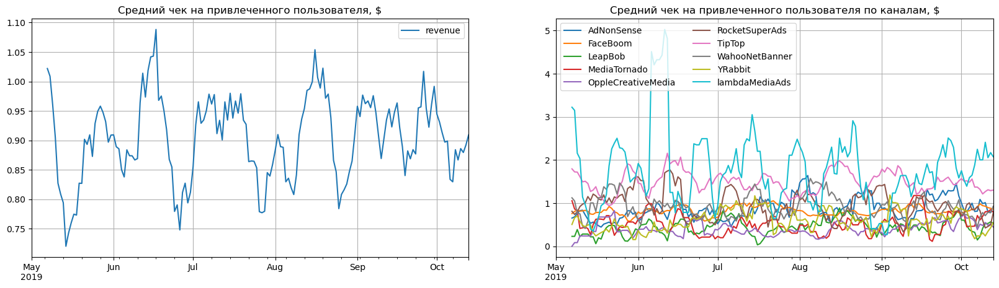

In [54]:
plt.figure(figsize=(20, 5))

ax1=plt.subplot(1, 2, 1)
revenue_profiles = (user_profiles
                    .query('first_ts < datetime(2019, 10, 14) and channel != "organic"')
                    .merge(orders_lifetime_14.groupby('user_id').agg({'revenue': 'sum'}), on='user_id', how='left')
                   )
revenue_profiles['revenue'] = revenue_profiles['revenue'].fillna(0)

revenue_profiles.pivot_table(index='dt', 
                             values='revenue', 
                             aggfunc='mean'
                            ).rolling(7).mean().plot(grid=True, ax=ax1)

plt.title('Средний чек на привлеченного пользователя, $')
plt.xlabel('')

ax2=plt.subplot(1, 2, 2)
revenue_profiles.pivot_table(index='dt',
                             columns='channel',
                             values='revenue', 
                             aggfunc='mean'
                            ).rolling(7).mean().plot(grid=True, ax=ax2)

plt.title('Средний чек на привлеченного пользователя по каналам, $')
plt.xlabel('')
plt.legend(loc='upper left', ncol=2)

plt.show()

Отметим, что в плане среднего чека на пользователя все каналы достаточно стабильны - ни один из них не показывает сильной тенденции ни к росту, ни к снижению.

#### Анализ FaceBoom

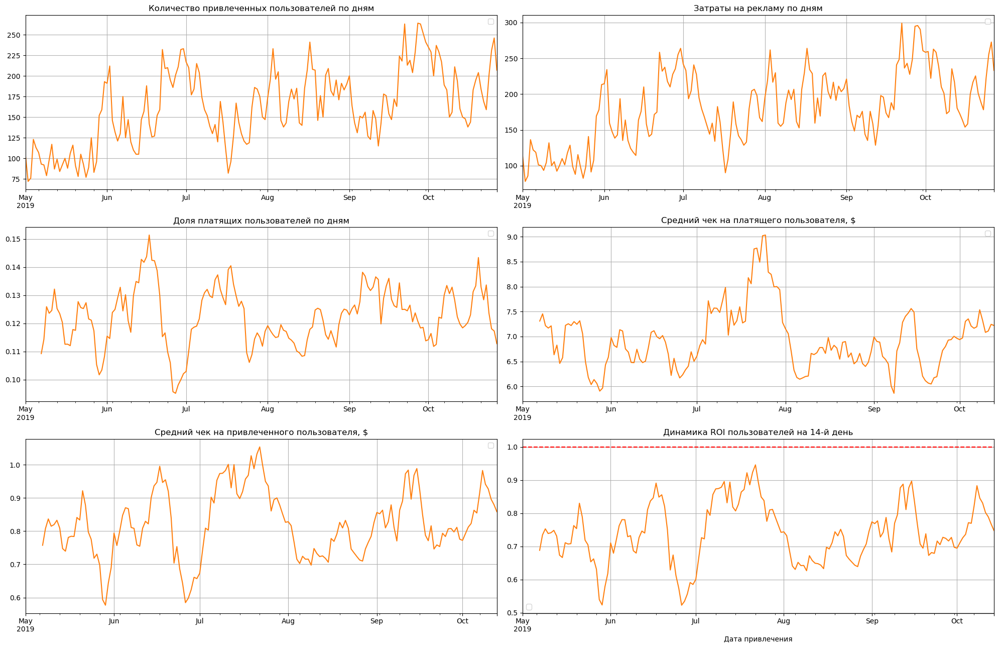

In [55]:
detailed_plot("FaceBoom", color='#ff7f0e')

По FaceBoom картина схожа, с той разницей, что увеличение затрат на рекламу и количество привлеченных пользователей сильнее кореллировали между собой (около 2.5 раз для обоих показателей). Поэтому в течение изучаемого периода ROI FaceBoom не падает, однако стабильно не превышает порог окупаемости. 

#### Анализ AdNonSense

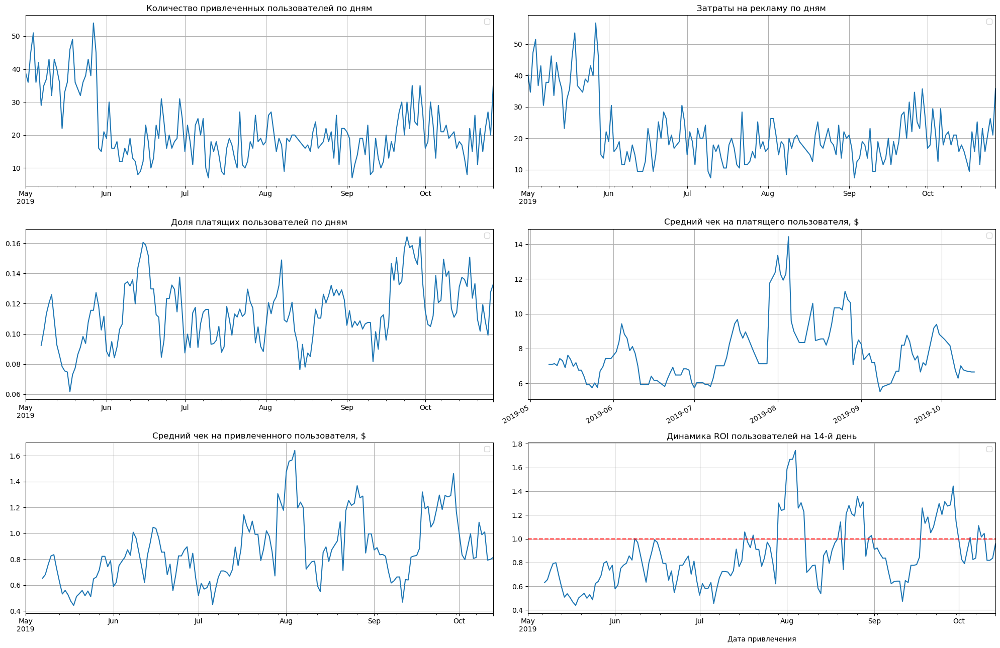

In [56]:
detailed_plot("AdNonSense", color='#1f77b4')

Тем временем по AdNonSense ситуация иная:
* при снижении затрат на рекламу снизилось число привлекаемых пользователей;
* при этом конверсия в рамках исследуемого периода, а также средний чек на пользователя показали **тенденцию к росту**;
* напомним, по общему показателю конверсии этот канал занимает второе место.

Таким образом, увеличение затрат на этот канал **может следать его доходным** - при условии, что CAC и конверсия останутся на прежних уровнях. Это также позволит увеличить число европейских пользователей, которые на данный момент тратят в среднем больше, чем американские.

#### Анализ RocketSuperAds

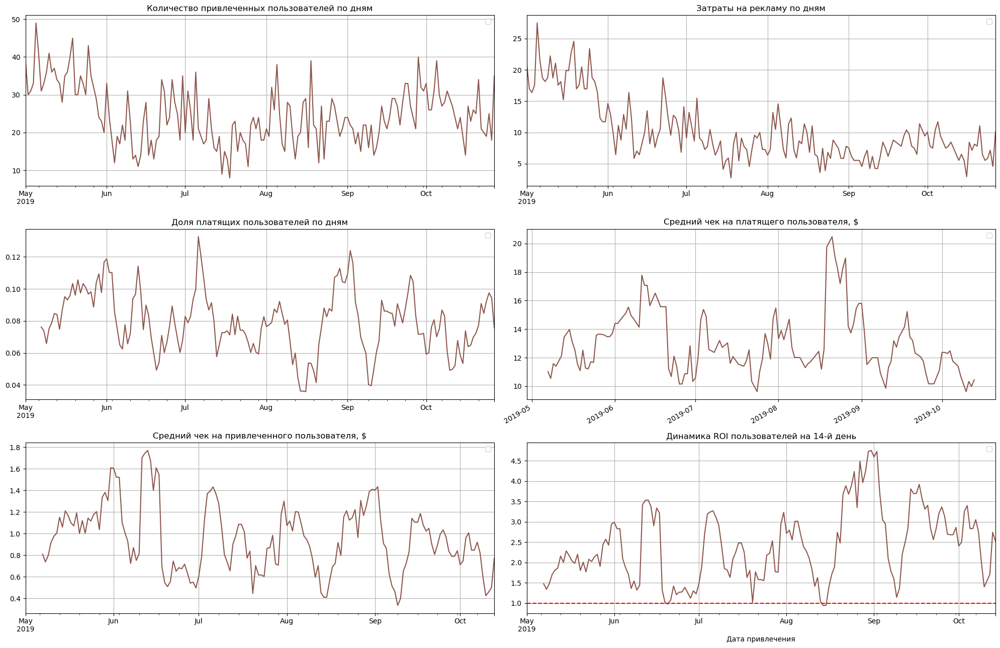

In [57]:
detailed_plot("RocketSuperAds", color='#8c564b')

RocketSuperAds - единственный канал, который на общих графиках **показал тенденцию к снижению стоимости привлечения пользователей**: 
* затраты на этот канал снижались на протяжении всего периода - с более чем 20 долларов до 5-10 долларов;
* при этом количество привлекаемых через этот канал пользователей сократилось не так значительно - около 1.5 раз;
* уровень конверсии остался на прежнем уровне;
* заметно небольшое снижение среднего чека на привлеченного пользователя.

Этот канал **можно рассматривать как один из драйверов роста**, особенно если учесть, что из трех окупаемых каналов привлечения американских пользователей у RocketSuperAds самый высокий показатель конверсии. Однако нужно быть осторожными и следить за показателями - если тенденция к снижению среднего чека продолжится, канал перестанет быть прибыльным.

#### Анализ YRabbit

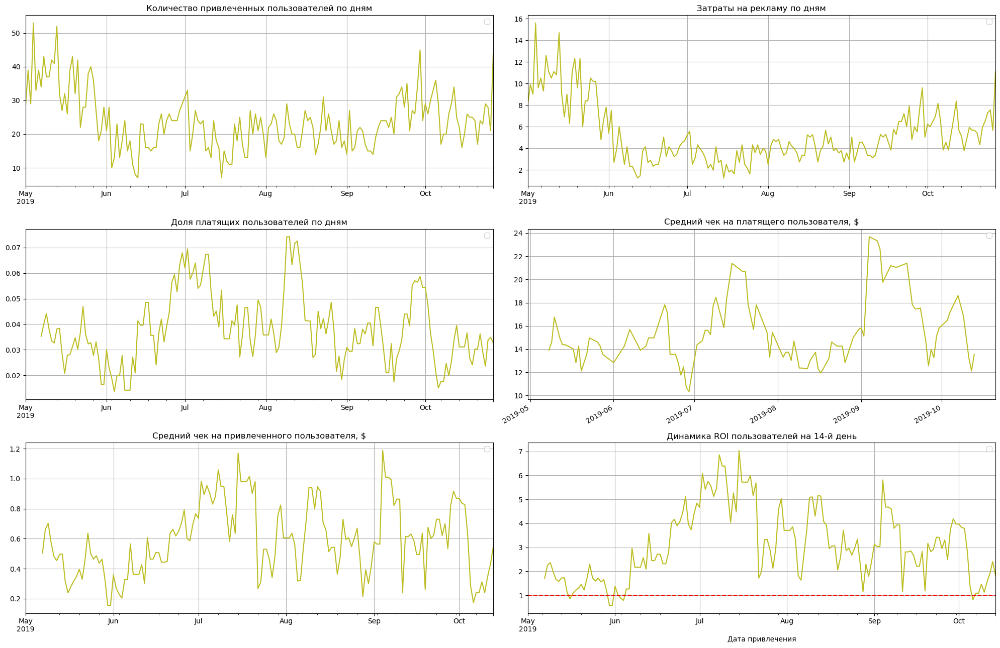

In [58]:
detailed_plot("YRabbit", color='#bcbd22')

В случае YRabbit количество привлеченных пользователей показывает сильную корелляцию с затратами на этот канал, в то время как остальные показатели остаются достаточно стабильными. Это позволяет предположить, что при увеличении затрат на YRabbit, количество пользователей увеличится, при этом их качество останется на том же уровне. Учитывая, что на данный момент показатель ROI для этого канала выше, чем для всех остальных, увеличение числа пользователей позволит повысить доходность приложения.

#### Анализ MediaTornado

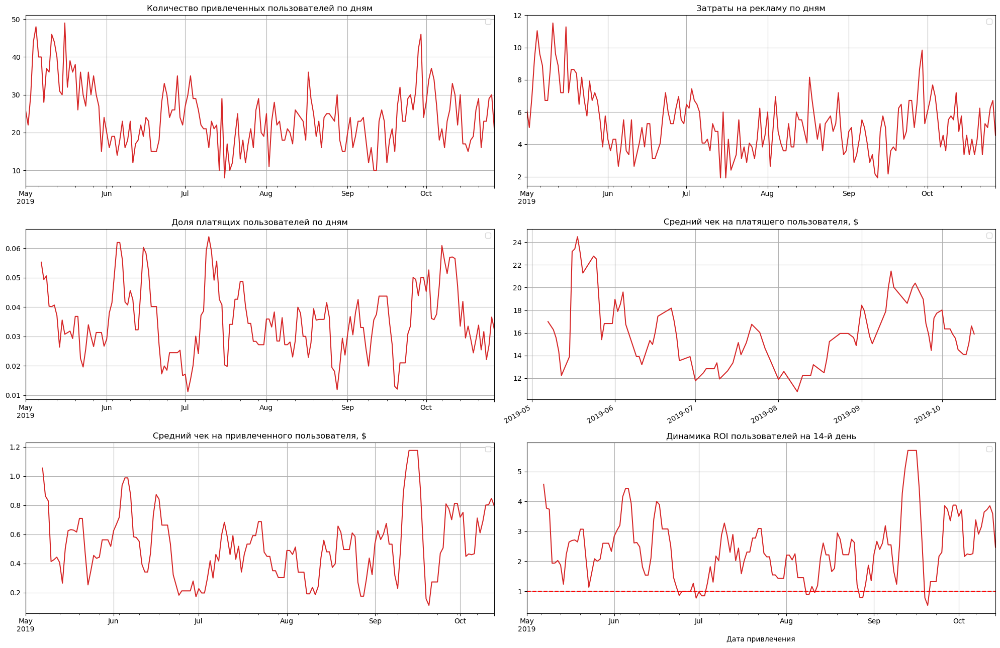

In [59]:
detailed_plot("MediaTornado", color='#d62728')

Показатели MediaTornado похожи на показатели YRabbit - сильная корелляция затрат на привлечение и числа новых пользователей при стабильных показателях конверсии и среднего чека.

#### LeapBob

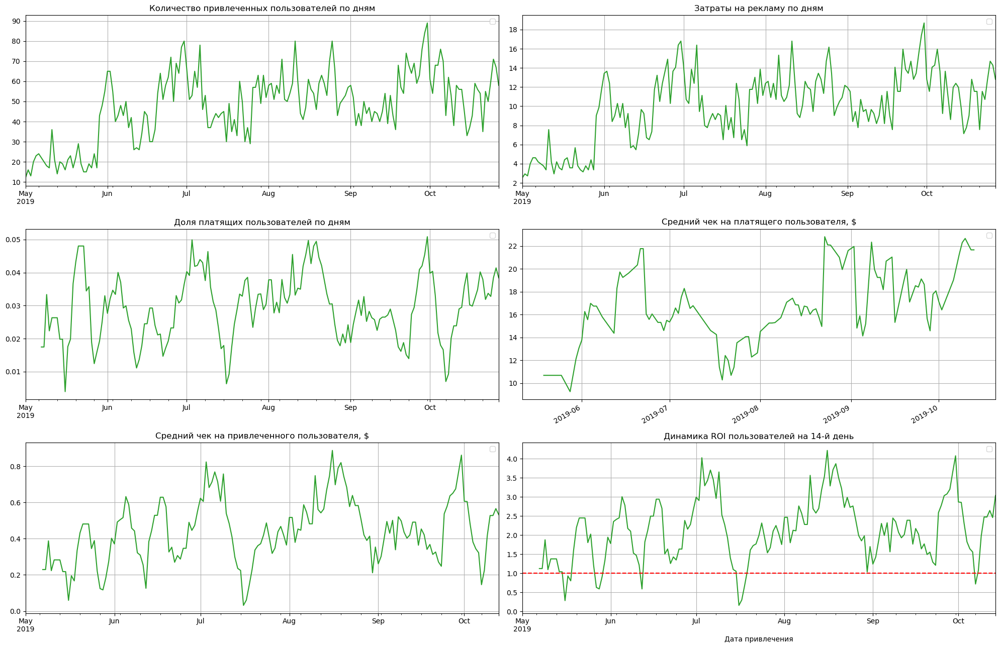

In [60]:
detailed_plot("LeapBob", color='#2ca02c')

На графиках LeapBob мы видим интересную особенность, которой не было на графиков предыдущих каналов - **пики конверсии достаточно сильно кореллируют с числом привлеченных пользователей** (а график числа привлеченных пользователей почти в точности повторяет график расходов на этот канал). При этом средний чек показывает тенденцию к росту. Все это позволяет предположить, что **увеличение расходов на этот канал приведет не только к росту числа привлеченных пользователей, но и к росту конверсии**, что, в свою очередь, положительно повляет на доходность.

#### Анализ OppleCreativeMedia

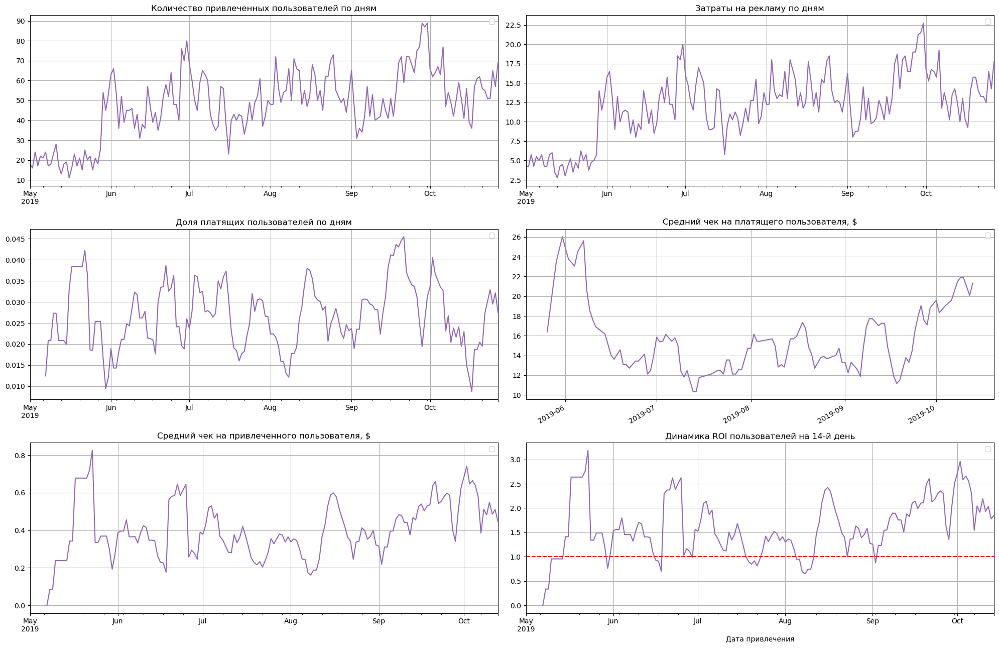

In [61]:
detailed_plot("OppleCreativeMedia", color='#9467bd')

OppleCreativeMedia показывает хорошую корелляцию между увеличением затрат и количеством привлеченных пользователей при стабильной конверсии и росте среднего чека на пользователя. Как и AdNonSense, увеличение затрат на этот канал позволит увеличить количество европейских пользователей.

#### Анализ WahooNetBanner

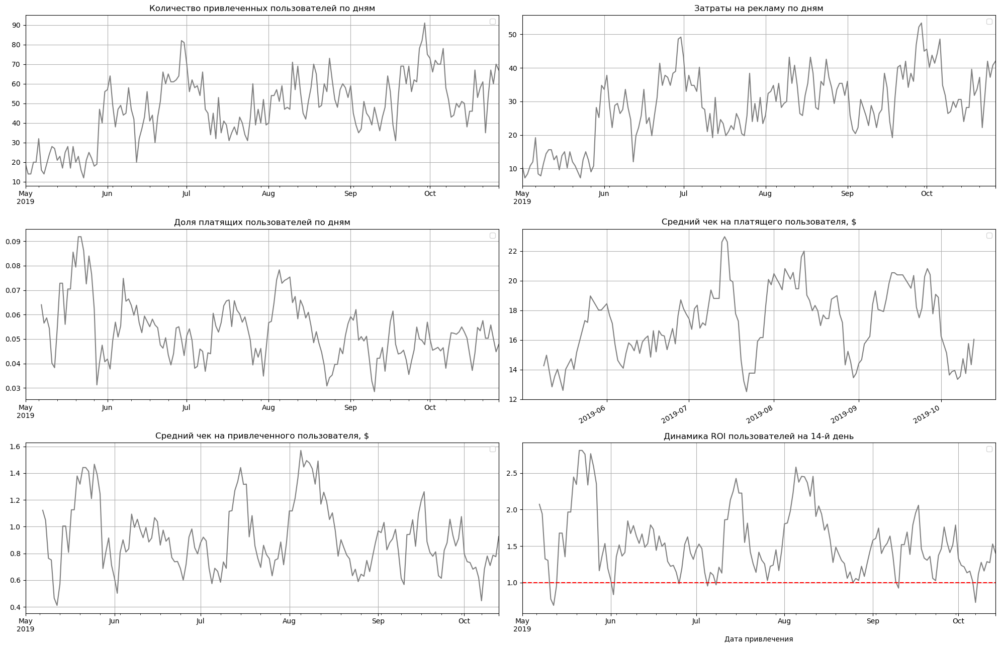

In [62]:
detailed_plot("WahooNetBanner", color='#7f7f7f')

WahooNetBanner показывает хорошую корелляцию затрат на канал и числа привлеченных пользователей, однако есть тенденция к снижению конверсии и намечающаяся тенденция к снижению среднего чека с ростом затрат на канал. Учитывая, что это канал привлечения европейских пользователей, есть смысл рассмотреть других кандидатов на увеличение бюджета.

#### Анализ lambdaMediaAds

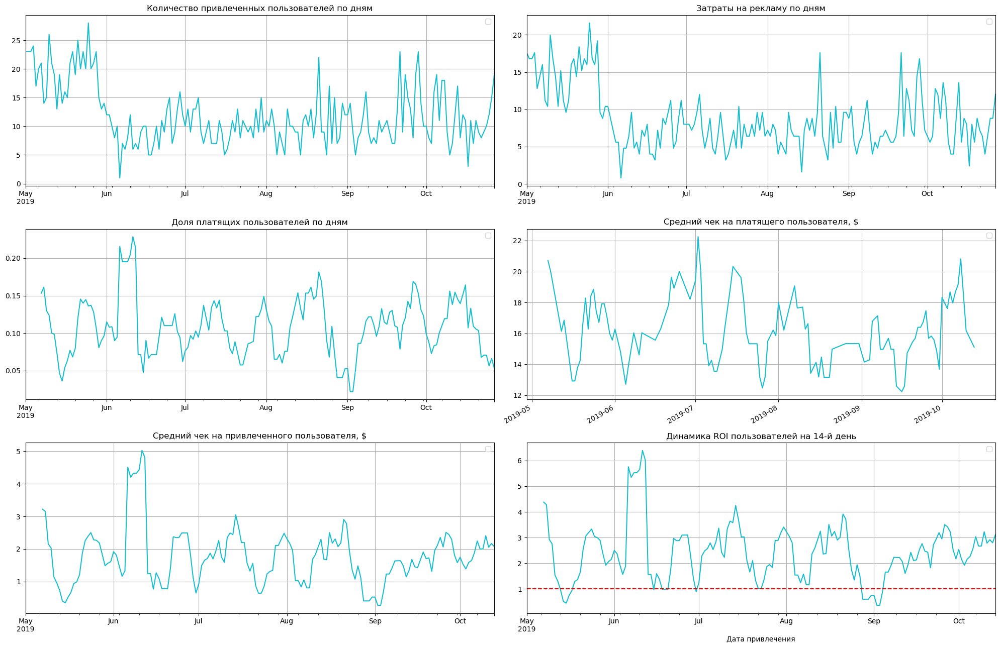

In [63]:
detailed_plot("lambdaMediaAds", color='#17becf')

У lambdaMediaAdsХорошая корелляция затрат и привлеченных пользователей, а также стабильные показатели конверсии и сренего чека. При этом данный канал - лидер по показателю конверсии.

#### Анализ лайфтайма заказов

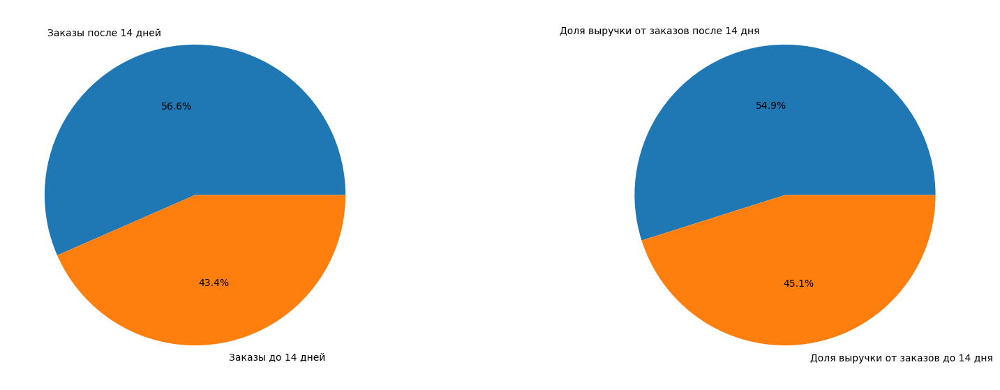

In [64]:
plt.figure(figsize=(20,7))

plt.subplot(1,2,1)
plt.pie([len(orders_lifetime) - len(orders_lifetime_14), len(orders_lifetime_14)], 
        labels=['Заказы после 14 дней', 'Заказы до 14 дней'],
        autopct='%1.1f%%',
       )

plt.subplot(1,2,2)
plt.pie([orders_lifetime.query('first_ts < datetime(2019, 10, 14)')['revenue'].sum() - orders_lifetime_14['revenue'].sum(),
         orders_lifetime_14['revenue'].sum()
        ],
        labels=['Доля выручки от заказов после 14 дня', 'Доля выручки от заказов до 14 дня'],
        autopct='%1.1f%%',
       )

plt.show()

Также стоит отметить, что более половины заказов и выручки приходится на лайфтайм выше двух недель. 

Для повышения выручки можно:
* сконцентрировать усилия на повышении удержания пользователей;
* сконцентрировать усилия на стимуляции пользователей тратить больше в первые две недели.

### Напишите выводы

- Выделите причины неэффективности привлечения пользователей.
- Сформулируйте рекомендации для отдела маркетинга.

В ходе исследования изучен период с начала мая по конец октября.

Общие положения:

* согласно бизнес-плану, привлеченные пользователи должны окапаться не позднее двух недель с момента первого захода в приложение;
* окупаемость рекламы стабильно падала: до начала августа затраты на рекламу окупались, начиная с августа они стабильно не окупаются;
* затраты на маркетинг стабильно росли;
* стоимость привлечения пользователей также стабильно росла;
* средний чек на привлеченного пользователя и LTV на 14-й день, а также конверсия и удержание не показывали тенденции ни к росту, ни к падению.

Более подробный анализ данных позволил выявить следующие крупные проблемы:
* пользователи, привлеченные через рекламу в **США**, показывают более высокий процент конверсии относительно пользователей из Европы (почти 10% против 5% к 14-му дню), однако при этом более **низкий показатель удержания** (менее 10% против 14-18% к 14-му дню), а также они совершают **меньше покупок и на меньшую сумму**, чем пользователи из Европы. При этом в США **самый высокий показатель CAC** - к концу изучаемого периода **пользователи из США обходились в 4 раза дороже пользователей из Европы**. Вероятнее всего, это связано с каналами привлечения пользователей;
* канал **TipTop показал значительное увеличение CAC** в течение исследуемого периода - в **3.5 раза**. Стоимость привлечения пользователей через этот канал минимум в 2 раза превышает аналогичный показатель для любого другого канала. **Затраты на канал составляют более 50% от общего бюджета**, однако окупились лишь наполовину, а динамика ROI показывает снижение;
* **FaceBoom, затраты на который составили более 30% от общего бюджета, являлся убыточным с самого начала**. Основная проблема канала - низкий показатель удержания - около 4%, тогда как у большинства других каналов этот показатель находится на уровне выше 10-20%.
* через два вышеуказанных канала привлекались пользователи только из США. Возможно, в этом основная причина низких показателей окупаемости региона;
* **AdNonSense** - последний из трех убыточных каналов. Причина такая же, как и у FaceBoom - низкий показатель удержания, который также находится на уровне 4%.

Анализ показателей с разбивкой по устройствам: все устройства показали отрицательную динамику ROI. При этом хуже всего показали себя платформы iPhone и Android. Однако это, вероятнее всего, связано с тем, что пользователи этих платформ приходили через наиболее проблемыне каналы - FaceBoom и TipTop.

Также отмечено более высокое удержание пользователей, которые меняют платформы. В рамках данного исследования не было достаточно информации, чтобы определить, связано ли это с различиями в реализации приложения на различных платформах или нет.

Анализ с разбивкой по странам: пользователи из США, привлеченные через рекламу, в среднем делают менее 4 покупок на общуу сумму менее 20 долларов. В то же время пользователи из Европы - более 5.5 покупок на общую сумму около 30 долларов. Возможно, упор на пользователей из США неоправдан, и приложение более актуально для европейцев. В то же время из-за особенностей каналов рекламы (нет ни одного канала, через который бы привлекались пользователи из Европы и США) нельзя однозначно утверждать, что это связано с особенностями региона, а не особенностями каналов привлечения.

**Рекомендации**:

* **сократить затраты на канал TipTop до значений начала мая** и проследить за динамикой. Если канал снова выйдет в зону окупаемости, оставить финансирование на этом уровне, если нет - прекратить продвижение через этот канал;
* **прекратить продвижение через FaceBoom**;
* для привлечения пользователей из США увеличить затраты на YRabbit, RocketSuperAds и Mediatornado. Сделать **упор на RocketSuperAds** и проследить за динамикой. Если показатели останутся на прежнем уровне или улучшатся, сохранить упор на данный канал, если начнут ухудшаться - сместить на два других;
* для привлечения пользователей из Европы увеличить затраты на все соответствующие каналы, кроме AdNonSense, **с упором на LeapBob**. У этого канала рост затрат показывает корелляцию не только с количеством привлеченных пользователей, но и с конверсией, что может дать мультипликативных эффект от вложенных в него средств.
* в случае **AdNonSense** можно или прекратить продвижение через этот канал, или оставить его на нынешнем невысоком уровне и проследить за динамикой. Если тренд на повышение ROI продолжится и показатель выйдет в зону окупаемости, можно увеличить расходы на этот канал.

На данный момент основу пользовательского пула составляют жители США, однако данные свидетельствуют о том, что они тратят меньше, чем европейцы. Отчасти это может быть связано с менее качественными каналами привлечения для США (TipTop и FaceBoom). Если после перераспределения рекламного бюджета ситуация не изменится:
* следует проанализировать платный контент. Возможно, он более актуален для жителей Европы, нежели США;
* изменить платный контент или сместить акцент с США на Европу, направив больше средств на соответсвующие каналы привлечения.

Также стоит расмотреть возможности **стимуляции пользователей на более ранние покупки**. На данный момент более половины всех покупок и более половины дохода приходятся на период свыше 14 дней с момента первого визита, хотя бизнес-план предполагает окупаемость пользователей к концу второй недели.